In [ ]:
 %cd /content/

/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/Colab\ Notebooks/MEDAI_DEC/archive.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7294_19890104/TCGA_DU_7294_19890104_9_mask.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_1.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10_mask.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11_mask.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12_mask.tif  
  inflating: /content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_

In [ ]:
!pip install torchview

In [ ]:
%cd /content

/content


In [ ]:

!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 7.6 MB/s eta 0:00:00


In [ ]:
# !pip install -U fvcore

In [ ]:
cfg_path= "/content/lgg-mri-segmentation/kaggle_3m"

import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torchsummary import summary
from torchview import draw_graph
import torch.optim.lr_scheduler as lr_scheduler
import torch.nn.functional as F
from torch.autograd import Variable

import matplotlib.pyplot as plt
from tqdm import tqdm
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import albumentations as A
from albumentations.pytorch import ToTensorV2
import PIL
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support, accuracy_score, f1_score, matthews_corrcoef
from skimage import io, transform, color
from sklearn.metrics import accuracy_score, precision_score,recall_score,f1_score

import random
from collections import defaultdict
import os
import shutil
import copy
from typing import Dict, List, Tuple
import graphviz
import argparse
from torch.utils.tensorboard import SummaryWriter

# /content/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif

In [ ]:


DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BATCH_SIZE = (16 if torch.cuda.device_count() < 2
        else (16 * torch.cuda.device_count()))
seed =768
NUM_WORKERS = os.cpu_count()
LR = 1e-3
PATIENCE= 5
EPOCHS=50
NUM_DEVICES = torch.cuda.device_count()



In [ ]:
NUM_WORKERS

2

In [ ]:

NUM_DEVICES

1

In [ ]:


# Fetching files from the directory
file_list= glob.glob(cfg_path+"/*/*.tif", recursive= True)

In [ ]:

len(file_list)

7858

In [ ]:
file_list[:5]

['/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_1.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_41_mask.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_29_mask.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_26_mask.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_6404_19850629/TCGA_DU_6404_19850629_12_mask.tif']

In [ ]:
# ID sorting for each scan

fl_copy= file_list

In [ ]:
def get_sample_numbers(image_paths):
  sample_numbers= []
  is_mask= []
  for f in image_paths:
    path_list= f.split('/')[-2:][1].split('_')
    print(path_list)

    if 'mask.tif' in path_list:
      sample_numbers.append(int(path_list[-2]))
      is_mask.append(1)
      print(is_mask)
      print(sample_numbers)
    else:
      sample_numbers.append(int(path_list[-1].replace('.tif', '')))
      is_mask.append(0)

  return sample_numbers, is_mask

def get_sample_patient_id(image_paths):
  return [(id_.split('/')[-2:][0]) for id_ in image_paths]



In [ ]:

get_sample_numbers(file_list)

['TCGA', 'DU', '6404', '19850629', '1.tif']
['TCGA', 'DU', '6404', '19850629', '41', 'mask.tif']
[0, 1]
[1, 41]
['TCGA', 'DU', '6404', '19850629', '29', 'mask.tif']
[0, 1, 1]
[1, 41, 29]
['TCGA', 'DU', '6404', '19850629', '26', 'mask.tif']
[0, 1, 1, 1]
[1, 41, 29, 26]
['TCGA', 'DU', '6404', '19850629', '12', 'mask.tif']
[0, 1, 1, 1, 1]
[1, 41, 29, 26, 12]
['TCGA', 'DU', '6404', '19850629', '21.tif']
['TCGA', 'DU', '6404', '19850629', '49.tif']
['TCGA', 'DU', '6404', '19850629', '19', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1]
[1, 41, 29, 26, 12, 21, 49, 19]
['TCGA', 'DU', '6404', '19850629', '23.tif']
['TCGA', 'DU', '6404', '19850629', '8.tif']
['TCGA', 'DU', '6404', '19850629', '38', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1]
[1, 41, 29, 26, 12, 21, 49, 19, 23, 8, 38]
['TCGA', 'DU', '6404', '19850629', '30.tif']
['TCGA', 'DU', '6404', '19850629', '25', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1]
[1, 41, 29, 26, 12, 21, 49, 19, 23, 8, 38, 30, 25]
['TCGA', 'DU', '6404', '19850629',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['TCGA', 'HT', '8111', '19980330', '18.tif']
['TCGA', 'HT', '8111', '19980330', '14.tif']
['TCGA', 'HT', '8111', '19980330', '1.tif']
['TCGA', 'CS', '6290', '20000917', '10.tif']
['TCGA', 'CS', '6290', '20000917', '3', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['TCGA', 'HT', '7881', '19981015', '27', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



([1,
  41,
  29,
  26,
  12,
  21,
  49,
  19,
  23,
  8,
  38,
  30,
  25,
  35,
  38,
  1,
  11,
  44,
  14,
  22,
  6,
  30,
  43,
  40,
  39,
  47,
  18,
  33,
  25,
  21,
  46,
  9,
  23,
  53,
  44,
  29,
  28,
  48,
  32,
  33,
  3,
  27,
  43,
  51,
  35,
  4,
  8,
  2,
  48,
  28,
  15,
  9,
  4,
  24,
  13,
  34,
  42,
  31,
  7,
  16,
  46,
  12,
  36,
  52,
  24,
  20,
  37,
  27,
  36,
  20,
  45,
  50,
  45,
  5,
  40,
  42,
  19,
  51,
  34,
  11,
  7,
  50,
  53,
  39,
  13,
  49,
  14,
  31,
  10,
  16,
  15,
  6,
  26,
  17,
  32,
  41,
  47,
  5,
  17,
  18,
  10,
  2,
  3,
  37,
  52,
  22,
  5,
  21,
  23,
  39,
  19,
  47,
  35,
  36,
  28,
  44,
  46,
  24,
  21,
  18,
  11,
  31,
  6,
  38,
  31,
  34,
  40,
  33,
  20,
  29,
  30,
  14,
  37,
  10,
  22,
  25,
  45,
  26,
  13,
  17,
  34,
  8,
  10,
  7,
  6,
  40,
  13,
  48,
  27,
  9,
  27,
  46,
  33,
  16,
  9,
  19,
  17,
  12,
  4,
  32,
  36,
  44,
  14,
  2,
  3,
  42,
  18,
  25,
  41,
  43,
  22,
  

In [ ]:

get_sample_patient_id(file_list)

['TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_6404_19850629',
 'TCGA_DU_64

In [ ]:

def build_df(image_paths):
  sample_numbers, mask_label= get_sample_numbers(image_paths)
  sample_df= pd.DataFrame({
      'id': sample_numbers ,
      'patient': get_sample_patient_id(image_paths),
      'image_path': image_paths,
      'is_mask': mask_label,

  })
  return sample_df

In [ ]:
dataset_df=(build_df(file_list).sort_values(by= ['id', 'patient', 'image_path']).reset_index(drop= True))

['TCGA', 'DU', '6404', '19850629', '1.tif']
['TCGA', 'DU', '6404', '19850629', '41', 'mask.tif']
[0, 1]
[1, 41]
['TCGA', 'DU', '6404', '19850629', '29', 'mask.tif']
[0, 1, 1]
[1, 41, 29]
['TCGA', 'DU', '6404', '19850629', '26', 'mask.tif']
[0, 1, 1, 1]
[1, 41, 29, 26]
['TCGA', 'DU', '6404', '19850629', '12', 'mask.tif']
[0, 1, 1, 1, 1]
[1, 41, 29, 26, 12]
['TCGA', 'DU', '6404', '19850629', '21.tif']
['TCGA', 'DU', '6404', '19850629', '49.tif']
['TCGA', 'DU', '6404', '19850629', '19', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1]
[1, 41, 29, 26, 12, 21, 49, 19]
['TCGA', 'DU', '6404', '19850629', '23.tif']
['TCGA', 'DU', '6404', '19850629', '8.tif']
['TCGA', 'DU', '6404', '19850629', '38', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1]
[1, 41, 29, 26, 12, 21, 49, 19, 23, 8, 38]
['TCGA', 'DU', '6404', '19850629', '30.tif']
['TCGA', 'DU', '6404', '19850629', '25', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1]
[1, 41, 29, 26, 12, 21, 49, 19, 23, 8, 38, 30, 25]
['TCGA', 'DU', '6404', '19850629',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['TCGA', 'HT', 'A61B', '19991127', '48.tif']
['TCGA', 'HT', 'A61B', '19991127', '54.tif']
['TCGA', 'HT', 'A61B', '19991127', '85', 'mask.tif']
[0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
dataset_df.head()

,id,patient,image_path,is_mask
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
1,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
2,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
3,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
4,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0


In [ ]:

#Group Samples by mask status

grouped_df= dataset_df.groupby(by= 'is_mask')
image_df = grouped_df.get_group(0).drop('is_mask', axis=1).reset_index(drop=True)
mask_df = grouped_df.get_group(1).drop('is_mask', axis=1).reset_index(drop=True)

In [ ]:
mask_df= mask_df.rename({'image_path' : 'mask_path'}, axis=1)

In [ ]:
mask_df

,id,patient,mask_path
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...


In [ ]:

def _load(image_path, as_tensor= True):
  image=Image.open(image_path)
  image= np.array(image).astype(np.float32) / 255.
  return image

def generate_label(mask_path, load_fn):
  mask= load_fn(mask_path)
  if mask.max() > 0:
    return 1
  return 0

In [ ]:
ds= image_df.merge(mask_df, on=['id', 'patient'], how='left')



In [ ]:

ds

,id,patient,image_path,mask_path
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
...,...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...


In [ ]:
ds['diagnosis'] = [generate_label(_, _load) for _ in tqdm(ds['mask_path'])]

100%|██████████| 3929/3929 [00:07<00:00, 520.68it/s]


In [ ]:
ds

,id,patient,image_path,mask_path,diagnosis
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
...,...,...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0


<ipython-input-30-2968cc3ca7e2>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  bar_plot= sns.barplot(
<ipython-input-30-2968cc3ca7e2>:10: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  bar_plot= sns.barplot(


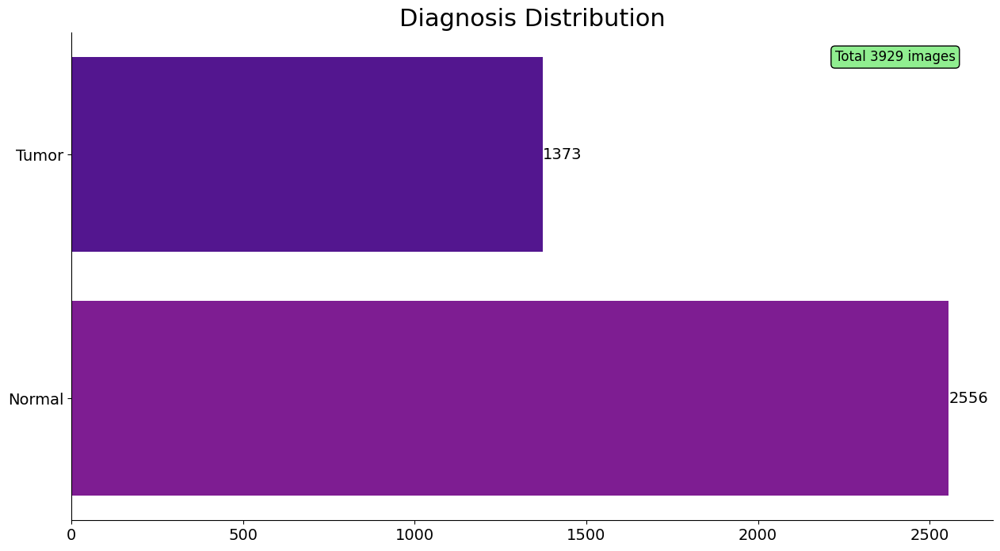

In [ ]:
# To View Diagnosis Distribution

fig= plt.figure(figsize= (15,8))

plt.title("Diagnosis Distribution", fontsize= 22)

diagnosis_distribution =ds['diagnosis'].value_counts().sort_values()
diagnosis_map = {0 : 'Normal', 1 : 'Tumor'}

bar_plot= sns.barplot(
    x= diagnosis_distribution.values,
    y= [diagnosis_map[_] for _ in diagnosis_distribution.keys()],
    palette= sns.color_palette("plasma"),
    orient= 'h'
)

for container in bar_plot.containers:
  bar_plot.bar_label(container, fmt= '%.0f', fontsize= 14)

plt.xticks(fontsize= 14)
plt.yticks(fontsize= 14)

text_params= {
    'x' : 2400,
    'y' : -0.4,
    's' : f"Total {len(ds)} images",
    'size' : 12,
    'color' : "Black",
    'ha'    : "center",
    'va'    : "center",
    'bbox'  : dict(boxstyle= "round", fc= ("lightgreen"), ec= ("black"))

}
plt.text(**text_params)

sns.despine()




diagnosi_map= [_ for _ in diagnosis_distribution.keys()]


In [ ]:
def view_sample(image, mask, color_map= 'rgb', fig_size= (16,8), title_size= 18):
  plt.figure(figsize= fig_size);
  plt.tight_layout();
  plt.subplots_adjust(top= 0.95);

  plt.subplot(1,3, 1);
  plt.title("MRI", fontsize= title_size);
  if color_map == "rgb":
    plt.imshow(image);
  else:
    plt.imshow(image, cmap= color_map);

  plt.subplot(1, 3, 2);
  plt.title("Mask", fontsize= title_size);
  plt.imshow(mask, cmap= "gray");

  plt.subplot(1, 3, 3);
  plt.title("MRI + Mask", fontsize= title_size);

  if color_map == "rgb":
    plt.imshow(image)
  else:
    plt.imshow(image, cmap= color_map)

  plt.imshow(mask, cmap="gray", alpha= 0.5);

  return








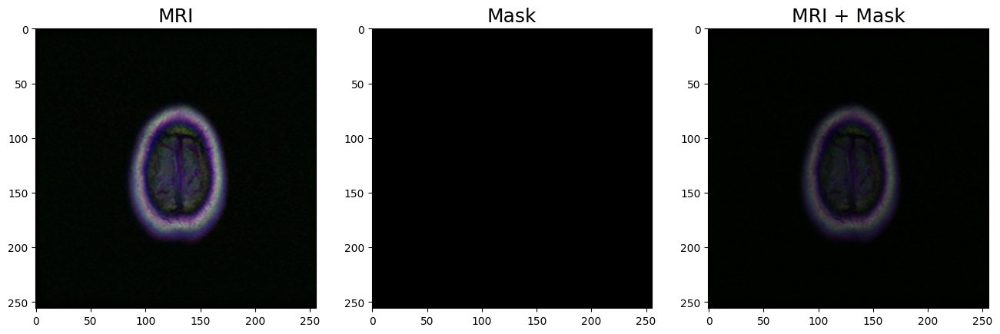

In [ ]:

rd_num= random.sample(ds.index.to_list(), 1)[0]
sample_image, sample_mask= _load(ds.image_path[rd_num]),  _load(ds.mask_path[rd_num])
view_sample(sample_image, sample_mask, color_map= 'mako')

In [ ]:
def view_multiple_sample(df, sample_loader, count= 10, color_map= "rgb", fig_size= (14, 10) ,title_size= 18):

  rd_num= random.sample(df.index.to_list(), count)
  plt.figure(figsize= fig_size);
  plt.tight_layout();
  plt.subplots_adjust(top= 0.95)

  for x, y in enumerate(rd_num):
    image, mask= (sample_loader(df.image_path[y]),sample_loader(df.mask_path[y]))

    idx= 3 * (x+1)
    plt.subplot(count+1, 3, idx+1);
    plt.title("MRI", fontsize= title_size);
    if color_map== "rgb":
      plt.imshow(image);
    else:
      plt.imshow(image, cmap= color_map);

    plt.subplot(count+1, 3, idx+2);
    plt.title("Mask", fontsize= title_size);
    plt.imshow(mask, cmap= "gray")

    plt.subplot(count+1, 3, idx+3)
    plt.title("MRI + MASK", fontsize= title_size)
    if color_map== "rgb":
      plt.imshow(image)
    else:
      plt.imshow(image, cmap= color_map)
    plt.imshow(mask, cmap ="gray", alpha= 0.5)

  return




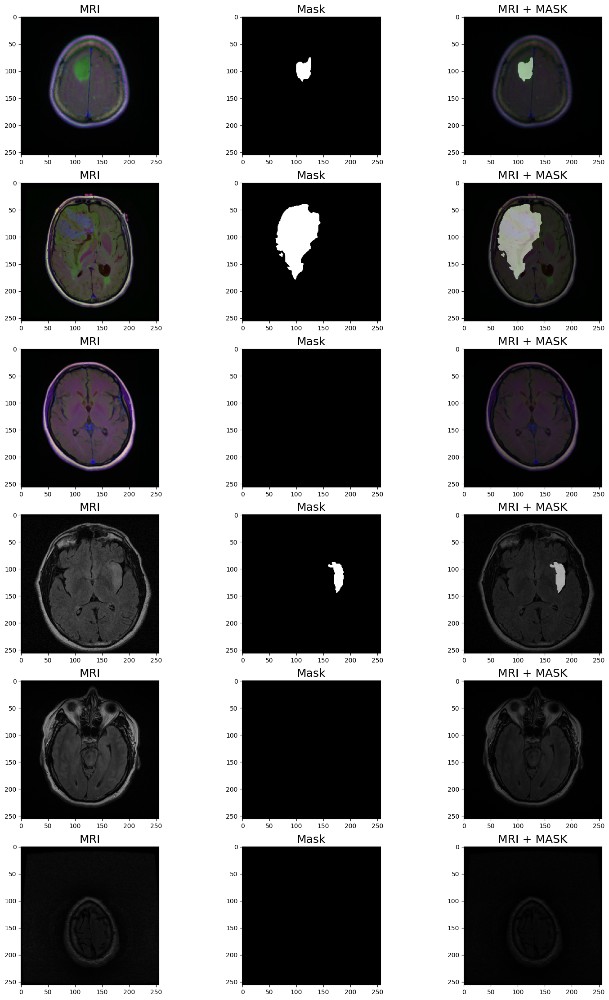

In [ ]:
view_multiple_sample(ds, _load, count=6, color_map = "mako", fig_size= (18, 30)  )


In [ ]:
#Augment train data
train_transforms= A.Compose([
    # A.RandomCrop(120, 120, p= 0.5),
    A.Resize(224, 224, p=1.0),
    A.RandomBrightnessContrast(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    ToTensorV2(),
])

# Reshape Inference data
inference_transforms= A.Compose([
    A.Resize(224, 224, p=1.0),
    ToTensorV2(),
])


In [ ]:
# class Glioma_dataloader(Dataset):
#   def __init__(self, img_name_list, lbl_name_list, transform=None):
#     self.image_name_list = img_name_list

#     self.label_name_list = lbl_name_list
#     self.transform = transform

#   def __len__(self):
#     return len(self.image_name_list)

#   def __getitem__(self, idx):
#     image = io.imread(self.image_name_list[idx],  plugin='pil')
#     imname = self.image_name_list[idx]
#     imidx = np.array([idx])
#     label = io.imread(self.label_name_list[idx],  plugin='pil')
#     sample= {'imidx': imidx, 'image': image, 'label': label}

#     if self.transform:
#       transformed= self.transform(image= image, label= label)
#       sample = {'imidx': imidx, 'image': transformed['image'], 'label': transformed['label']}
#     return sample

In [ ]:
class MRISegmentationDataset(Dataset):
  def __init__(self, df:pd.DataFrame, transform= None) -> None:
    super().__init__()

    self.mri_paths= df['image_path'].to_list()
    self.mask_paths= df['mask_path'].to_list()

    self.transform= transform

  def load_sample(self, index:str) -> Image.Image:
    image_path= self.mri_paths[index]
    mask_path= self.mask_paths[index]

    image= Image.open(image_path)
    mask= Image.open(mask_path)

    image= np.array(image).astype(np.float32) /255.
    mask= np.array(mask).astype(np.float32) /255.


    return image, mask

  def __len__(self) -> int:
    return self.mri_paths.__len__()

  def __getitem__(self, index:int) -> Tuple[torch.Tensor, torch.Tensor]:
    image,mask = self.load_sample(index)

    if self.transform:
      transformed= self.transform(image= image, mask= mask)
      return transformed['image'], transformed['mask'].unsqueeze_(0)
    else:
      transformed= ToTensorV2()(image= image, mask=mask)
      return transformed['image'], transformed['mask'].unsqueeze_(0)








In [ ]:
class BCEDiceLoss(nn.Module):
  def __init__(self):
    super().__init__()

  def forward(self, input, target):
    bce = F.binary_cross_entropy_with_logits(input, target)
    smooth = 1e-5
    input = torch.sigmoid(input)
    # input = torch.tanh(input)
    num = target.size(0)
    input = input.view(num, -1)
    target = target.view(num, -1)
    intersection = (input * target)
    dice = (2. * intersection.sum(1) + smooth) / (input.sum(1) + target.sum(1) + smooth)
    dice = 1 - dice.sum() / num
    return 0.5 * bce + dice


class GliomaNetLoss(nn.Module):
  def __init__(self):
    super(GliomaNetLoss, self).__init__()
    self.loss = BCEDiceLoss()

  def forward(self, d0, d1, d2, d3, d4, d5, d6, labels_v):
    loss0 = self.loss(d0, labels_v)
    loss1 = self.loss(d1, labels_v)
    loss2 = self.loss(d2, labels_v)
    loss3 = self.loss(d3, labels_v)
    loss4 = self.loss(d4, labels_v)
    loss5 = self.loss(d5, labels_v)
    loss6 = self.loss(d6, labels_v)
    loss = loss0 + loss1 + loss2 + loss3 + loss4 + loss5 + loss6
    print("l0: %3f, l1: %3f, l2: %3f, l3: %3f, l4: %3f, l5: %3f, l6: %3f\n" % (
        loss0.data, loss1.data, loss2.data, loss3.data, loss4.data, loss5.data, loss6.data,))
    return loss0, loss

In [ ]:

class Attention_block(nn.Module):
  def __init__(self, F_g, F_l, F_int):
    super(Attention_block, self).__init__()
    self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
    self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
    self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
    self.relu = nn.ReLU(inplace=True)

  def forward(self, g, x):
    g1 = self.W_g(g)
    x1 = self.W_x(x)
    psi = self.relu(g1 + x1)
    psi = self.psi(psi)
    return x * psi

In [ ]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F
# import math

# op_type= 'ad'
# def createConvFunc(op_type):
#   assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#   if op_type == 'cv':
#     return F.conv2d

#   if op_type == 'cd':
#     def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#       assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#       assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#       assert padding == dilation, 'padding for cd_conv set wrong'

#       weights_c = weights.sum(dim=[2, 3], keepdim=True)
#       yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#       y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#       return y - yc
#     return func
#   elif op_type == 'ad':
#     def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#       assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#       assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#       assert padding == dilation, 'padding for ad_conv set wrong'

#       shape = weights.shape
#       weights = weights.view(shape[0], shape[1], -1)
#       weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#       y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#       return y
#     return func
#   elif op_type == 'rd':
#     def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#       assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#       assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#       padding = 2 * dilation

#       shape = weights.shape
#       if weights.is_cuda:
#           buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#       else:
#           buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#       weights = weights.view(shape[0], shape[1], -1)
#       buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#       buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#       buffer[:, :, 12] = 0
#       buffer = buffer.view(shape[0], shape[1], 5, 5)
#       y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#       return y
#     return func
#   else:
#     print('impossible to be here unless you force that')
#     return None

# class PiDCONV(nn.Module):
#   def __init__(self, pdc,in_ch= 3, out_ch=3, kernel_size= 3, stride= 1, padding=0, dilation=1, groups=1, bias= False):
#     super(PiDCONV, self).__init__()

#     assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#     self.dilation= dilation
#     self.padding= self.dilation
#     self.groups = groups
#     self.stride= stride
#     self.weight = nn.Parameter(torch.Tensor(out_ch, in_ch // groups, kernel_size, kernel_size))
#     if bias:
#       self.bias = nn.Parameter(torch.Tensor(out_ch))
#     else:
#       self.register_parameter('bias', None)
#     self.reset_parameters()
#     self.pdc = pdc
#     self.bn_s1 = nn.BatchNorm2d(out_ch)
#     self.relu_s1 = nn.ReLU(inplace=True)

#   def reset_parameters(self):
#     nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#     if self.bias is not None:
#       fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#       bound = 1 / math.sqrt(fan_in)
#       nn.init.uniform_(self.bias, -bound, bound)



#   def forward(self, input):
#     out= self.relu_s1(self.bn_s1(self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)))
#     return out





# ## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):

#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')

#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, pdc, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU7,self).__init__()

#         self.pidconvin = PiDCONV(pdc, in_ch, out_ch, stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv1 = PiDCONV(pdc,out_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv2 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv3 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv4 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv5 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv6 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv7 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=2, groups=1, bias= False)

#         self.pidconv6d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv5d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv4d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv3d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv2d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv1d = PiDCONV(pdc, mid_ch*2,out_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#     def forward(self,x):

#         hx = x
#         hxin = self.pidconvin(hx)

#         hx1 = self.pidconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.pidconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.pidconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.pidconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.pidconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.pidconv6(hx)

#         hx7 = self.pidconv7(hx6)

#         hx6d =  self.pidconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.pidconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.pidconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.pidconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.pidconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.pidconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin
# # class REBNCONV(nn.Module):
# #     def __init__(self,in_ch=3,out_ch=3,dirate=1):
# #         super(REBNCONV,self).__init__()

# #         self.conv_s1 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
# #         self.bn_s1 = nn.BatchNorm2d(out_ch)
# #         self.relu_s1 = nn.ReLU(inplace=True)

# #     def forward(self,x):

# #         hx = x
# #         xout = self.relu_s1(self.bn_s1(self.conv_s1(hx)))

# #         return xout


# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, pdc, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.pidconvin = PiDCONV(pdc, in_ch, out_ch, stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv1 = PiDCONV(pdc,out_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv2 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv3 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv4 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv5 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv6 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=2, groups=1, bias= False)

#         self.pidconv5d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv4d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv3d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv2d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv1d = PiDCONV(pdc, mid_ch*2,out_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#     def forward(self,x):

#         hx = x

#         hxin = self.pidconvin(hx)

#         hx1 = self.pidconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.pidconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.pidconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.pidconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.pidconv5(hx)

#         hx6 = self.pidconv6(hx5)


#         hx5d =  self.pidconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.pidconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.pidconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.pidconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.pidconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, pdc,in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.pidconvin = PiDCONV(pdc, in_ch, out_ch, stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv1 = PiDCONV(pdc,out_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv2 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv3 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv4 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv5 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=2, groups=1, bias= False)

#         self.pidconv4d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv3d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv2d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv1d = PiDCONV(pdc, mid_ch*2,out_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#     def forward(self,x):

#         hx = x

#         hxin = self.pidconvin(hx)

#         hx1 = self.pidconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.pidconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.pidconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.pidconv4(hx)

#         hx5 = self.pidconv5(hx4)

#         hx4d = self.pidconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.pidconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.pidconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.pidconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, pdc, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.pidconvin = PiDCONV(pdc, in_ch, out_ch, stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv1 = PiDCONV(pdc,out_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv2 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.pidconv3 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv4 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=2, groups=1, bias= False)

#         self.pidconv3d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv2d = PiDCONV(pdc, mid_ch*2,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv1d = PiDCONV(pdc, mid_ch*2,out_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#     def forward(self,x):

#         hx = x

#         hxin = self.pidconvin(hx)

#         hx1 = self.pidconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.pidconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.pidconv3(hx)

#         hx4 = self.pidconv4(hx3)

#         hx3d = self.pidconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.pidconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.pidconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

#     def __init__(self, pdc,in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4F,self).__init__()

#         self.pidconvin = PiDCONV(pdc, in_ch, out_ch, stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#         self.pidconv1 = PiDCONV(pdc,out_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)
#         self.pidconv2 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=2, groups=1, bias= False)
#         self.pidconv3 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=4, groups=1, bias= False)

#         self.pidconv4 = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=8, groups=1, bias= False)

#         self.pidconv3d = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=4, groups=1, bias= False)
#         self.pidconv2d = PiDCONV(pdc,mid_ch,mid_ch,stride=1 , kernel_size=3, padding=0, dilation=2, groups=1, bias= False)
#         self.pidconv1d = PiDCONV(pdc,mid_ch,out_ch,stride=1 , kernel_size=3, padding=0, dilation=1, groups=1, bias= False)

#     def forward(self,x):

#         hx = x

#         hxin = self.pidconvin(hx)

#         hx1 = self.pidconv1(hxin)
#         hx2 = self.pidconv2(hx1)
#         hx3 = self.pidconv3(hx2)

#         hx4 = self.pidconv4(hx3)

#         hx3d = self.pidconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.pidconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.pidconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ### U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):

#     def __init__(self,pdc, in_ch=3,out_ch=1, F_int=64):
#         super(Glioma_U2NETPiD,self).__init__()

#         self.stage1 = RSU7(pdc, in_ch,16,64)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(pdc, 64,16,64)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(pdc, 64,16,64)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(pdc, 64,16,64)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(64,16,64)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(64,16,64)

#         # decoder
#         self.attnblock5= Attention_block(64, 64, F_int)
#         self.stage5d = RSU4F(128,16,64)
#         self.attnblock4= Attention_block(64, 64, F_int)
#         self.stage4d = RSU4(pdc, 128,16,64)
#         self.attnblock3= Attention_block(64, 64, F_int)
#         self.stage3d = RSU5(pdc, 128,16,64)
#         self.attnblock2= Attention_block(64, 64, F_int)
#         self.stage2d = RSU6(pdc, 128,16,64)
#         self.attnblock1= Attention_block(64, 64, F_int)
#         self.stage1d = RSU7(pdc, 128,16,64)

#         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6

#         # return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

In [ ]:
# pdc= createConvFunc(op_type)

# sample_net= Glioma_U2NETPiD(pdc, in_ch=3, out_ch=3, F_int= 64)
# summary(sample_net, input_size=(3, 224, 224), batch_size= 1)

In [ ]:
# #Exp ori

# import torch
# import torch.nn as nn
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.optim as optim
# from torchsummary import summary
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torch.autograd import Variable
# import math

# class Conv2d(nn.Module):
#     def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
#         super(Conv2d, self).__init__()
#         if in_channels % groups != 0:
#             raise ValueError('in_channels must be divisible by groups')
#         if out_channels % groups != 0:
#             raise ValueError('out_channels must be divisible by groups')
#         self.in_channels = in_channels
#         self.out_channels = out_channels
#         self.kernel_size = kernel_size
#         self.stride = stride
#         self.padding = padding
#         self.dilation = dilation
#         self.groups = groups
#         self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
#         if bias:
#             self.bias = nn.Parameter(torch.Tensor(out_channels))
#         else:
#             self.register_parameter('bias', None)
#         self.reset_parameters()
#         assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
#         self.pdc = createConvFunc(pdc)

#     def reset_parameters(self):
#         nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#         if self.bias is not None:
#             fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#             bound = 1 / math.sqrt(fan_in)
#             nn.init.uniform_(self.bias, -bound, bound)

#     def forward(self, input):
#         return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


# ## cd, ad, rd convolutions
# def createConvFunc(op_type):
#     assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#     if op_type == 'cv':
#         return F.conv2d

#     if op_type == 'cd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#             assert padding == dilation, 'padding for cd_conv set wrong'

#             weights_c = weights.sum(dim=[2, 3], keepdim=True)
#             yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#             y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y - yc
#         return func
#     elif op_type == 'ad':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#             assert padding == dilation, 'padding for ad_conv set wrong'

#             shape = weights.shape
#             weights = weights.view(shape[0], shape[1], -1)
#             weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#             y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     elif op_type == 'rd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#             padding = 2 * dilation

#             shape = weights.shape
#             if weights.is_cuda:
#                 buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#             else:
#                 buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#             weights = weights.view(shape[0], shape[1], -1)
#             buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#             buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#             buffer[:, :, 12] = 0
#             buffer = buffer.view(shape[0], shape[1], 5, 5)
#             y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     else:
#         print('impossible to be here unless you force that')
#         return None




# class Attention_block(nn.Module):
#   def __init__(self, F_g, F_l, F_int):
#     super(Attention_block, self).__init__()
#     self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
#     self.relu = nn.ReLU(inplace=True)

#   def forward(self, g, x):
#     g1 = self.W_g(g)
#     x1 = self.W_x(x)
#     psi = self.relu(g1 + x1)
#     psi = self.psi(psi)
#     return x * psi


# class REBNCONV(nn.Module):
#     def __init__(self, in_ch, out_ch, dirate=1 , pdc = "ad"):
#         super(REBNCONV, self).__init__()
#         self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False)
#         self.relu2 = nn.ReLU()
#         self.conv2 = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)

#     def forward(self, x):

#         y = self.conv1(x)
#         y = self.relu2(y)
#         y = self.conv2(y)
#         # print(x.shape , y.shape)
#         #y = y + x
#         return y




# # class REBNCONV(nn.Module):
# #     def __init__(self,in_ch=3,out_ch=3,dirate=1):
# #         super(REBNCONV,self).__init__()
# #         self.conv_s1 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
# #         self.bn_s1 = nn.BatchNorm2d(out_ch)
# #         self.relu_s1 = nn.ReLU(inplace=True)
# #
# #     def forward(self,x):
# #         hx = x
# #         xout = self.relu_s1(self.bn_s1(self.conv_s1(hx)))
# #         return xout

# ## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):
#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU7,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv7 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv6d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x
#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.rebnconv6(hx)

#         hx7 = self.rebnconv7(hx6)

#         hx6d =  self.rebnconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.rebnconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)

#         hx6 = self.rebnconv6(hx5)


#         hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)

#         hx5 = self.rebnconv5(hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4F,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=2)
#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx2 = self.rebnconv2(hx1)
#         hx3 = self.rebnconv3(hx2)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.rebnconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.rebnconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ### U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):

#     def __init__(self,in_ch=3,out_ch=1, F_int= 64):
#         super(Glioma_U2NETPiD,self).__init__()

#         self.stage1 = RSU7(in_ch,16,64)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(64,16,64)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(64,16,64)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(64,16,64)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(64,16,64)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(64,16,64)

#         # decoder
#         self.attnblock5= Attention_block(64, 64, F_int)
#         self.stage5d = RSU4F(128,16,64)
#         self.attnblock4= Attention_block(64, 64, F_int)
#         self.stage4d = RSU4(128,16,64)
#         self.attnblock3= Attention_block(64, 64, F_int)
#         self.stage3d = RSU5(128,16,64)
#         self.attnblock2= Attention_block(64, 64, F_int)
#         self.stage2d = RSU6(128,16,64)
#         self.attnblock1= Attention_block(64, 64, F_int)
#         self.stage1d = RSU7(128,16,64)

#         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6

#         # return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)


In [ ]:
# #Exp1 4/10 - for 10 epochs
# import torch
# import torch.nn as nn
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.optim as optim
# from torchsummary import summary
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torch.autograd import Variable
# import math

# class Conv2d(nn.Module):
#     def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
#         super(Conv2d, self).__init__()
#         if in_channels % groups != 0:
#             raise ValueError('in_channels must be divisible by groups')
#         if out_channels % groups != 0:
#             raise ValueError('out_channels must be divisible by groups')
#         self.in_channels = in_channels
#         self.out_channels = out_channels
#         self.kernel_size = kernel_size
#         self.stride = stride
#         self.padding = padding
#         self.dilation = dilation
#         self.groups = groups
#         self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
#         # print(self.weight.shape, "Weights Shape")
#         if bias:
#             self.bias = nn.Parameter(torch.Tensor(out_channels))
#         else:
#             self.register_parameter('bias', None)
#         self.reset_parameters()
#         assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
#         self.pdc = createConvFunc(pdc)

#     def reset_parameters(self):
#         nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#         if self.bias is not None:
#             fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#             bound = 1 / math.sqrt(fan_in)
#             nn.init.uniform_(self.bias, -bound, bound)

#     def forward(self, input):
#         return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


# ## cd, ad, rd convolutions
# def createConvFunc(op_type):
#     assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#     if op_type == 'cv':
#         return F.conv2d

#     if op_type == 'cd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#             assert padding == dilation, 'padding for cd_conv set wrong'

#             weights_c = weights.sum(dim=[2, 3], keepdim=True)
#             yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#             y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y - yc
#         return func
#     elif op_type == 'ad':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#             assert padding == dilation, 'padding for ad_conv set wrong'

#             shape = weights.shape
#             weights = weights.view(shape[0], shape[1], -1)
#             weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#             y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     elif op_type == 'rd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#             padding = 2 * dilation

#             shape = weights.shape
#             if weights.is_cuda:
#                 buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#             else:
#                 buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#             weights = weights.view(shape[0], shape[1], -1)
#             buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#             buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#             buffer[:, :, 12] = 0
#             buffer = buffer.view(shape[0], shape[1], 5, 5)
#             y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     else:
#         print('impossible to be here unless you force that')
#         return None




# class Attention_block(nn.Module):
#   def __init__(self, F_g, F_l, F_int):
#     super(Attention_block, self).__init__()
#     self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
#     self.relu = nn.ReLU(inplace=True)

#   def forward(self, g, x):
#     g1 = self.W_g(g)
#     x1 = self.W_x(x)
#     psi = self.relu(g1 + x1)
#     psi = self.psi(psi)
#     return x * psi


# class REBNCONV(nn.Module):
#     def __init__(self, in_ch, out_ch, dirate=1 , pdc = "ad"):
#         super(REBNCONV, self).__init__()
#         self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False)
#         # self.relu2 = nn.ReLU()
#         # self.conv2 = nn.Conv2d(in_ch, in_ch, kernel_size=1, padding=0, bias=False)
#         # self.conv_s1 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
#         self.bn1 = nn.BatchNorm2d(in_ch)
#         self.relu1 = nn.ReLU(inplace=True)
#         self.conv2 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
#         self.bn2 = nn.BatchNorm2d(out_ch)
#         self.relu2 = nn.ReLU(inplace=True)



#     def forward(self, x):

#         y = self.relu1(self.bn1(self.conv1(x)))
#         y = self.relu2(self.bn2(self.conv2(y)))
#         return y




# class REBNCONV(nn.Module):
#     def __init__(self,in_ch=3,out_ch=3,dirate=1):
#         super(REBNCONV,self).__init__()
#         self.conv_s1 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
#         self.bn_s1 = nn.BatchNorm2d(out_ch)
#         self.relu_s1 = nn.ReLU(inplace=True)
#
#     def forward(self,x):
#         hx = x
#         xout = self.relu_s1(self.bn_s1(self.conv_s1(hx)))
#         return xout

## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):
#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=12):
#         super(RSU7,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.reg_conv2= nn.Conv2d(mid_ch, kernel_size=3, padding=1, stride =1)

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv7 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv6d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x
#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.rebnconv6(hx)

#         hx7 = self.rebnconv7(hx6)

#         hx6d =  self.rebnconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.rebnconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)

#         hx6 = self.rebnconv6(hx5)


#         hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)

#         hx5 = self.rebnconv5(hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4F,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=2)
#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx2 = self.rebnconv2(hx1)
#         hx3 = self.rebnconv3(hx2)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.rebnconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.rebnconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ### U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):

#     def __init__(self,in_ch=3,out_ch=1, F_int= 64):
#         super(Glioma_U2NETPiD,self).__init__()

#         self.stage1 = RSU7(in_ch,16,64)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(64,16,64)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(64,16,64)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(64,16,64)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(64,16,64)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(64,16,64)

#         # decoder
#         self.attnblock5= Attention_block(64, 64, F_int)
#         self.stage5d = RSU4F(128,16,64)
#         self.attnblock4= Attention_block(64, 64, F_int)
#         self.stage4d = RSU4(128,16,64)
#         self.attnblock3= Attention_block(64, 64, F_int)
#         self.stage3d = RSU5(128,16,64)
#         self.attnblock2= Attention_block(64, 64, F_int)
#         self.stage2d = RSU6(128,16,64)
#         self.attnblock1= Attention_block(64, 64, F_int)
#         self.stage1d = RSU7(128,16,64)

#         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6


In [ ]:
# #Exp2 3/10
# import torch
# import torch.nn as nn
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.optim as optim
# from torchsummary import summary
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torch.autograd import Variable
# import math

# class Conv2d(nn.Module):
#     def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
#         super(Conv2d, self).__init__()
#         if in_channels % groups != 0:
#             raise ValueError('in_channels must be divisible by groups')
#         if out_channels % groups != 0:
#             raise ValueError('out_channels must be divisible by groups')
#         self.in_channels = in_channels
#         self.out_channels = out_channels
#         self.kernel_size = kernel_size
#         self.stride = stride
#         self.padding = padding
#         self.dilation = dilation
#         self.groups = groups
#         self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
#         # print(self.weight.shape, "Weights Shape")
#         if bias:
#             self.bias = nn.Parameter(torch.Tensor(out_channels))
#         else:
#             self.register_parameter('bias', None)
#         self.reset_parameters()
#         assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
#         self.pdc = createConvFunc(pdc)

#     def reset_parameters(self):
#         nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#         if self.bias is not None:
#             fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#             bound = 1 / math.sqrt(fan_in)
#             nn.init.uniform_(self.bias, -bound, bound)

#     def forward(self, input):
#         return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


# ## cd, ad, rd convolutions
# def createConvFunc(op_type):
#     assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#     if op_type == 'cv':
#         return F.conv2d

#     if op_type == 'cd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#             assert padding == dilation, 'padding for cd_conv set wrong'

#             weights_c = weights.sum(dim=[2, 3], keepdim=True)
#             yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#             y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y - yc
#         return func
#     elif op_type == 'ad':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#             assert padding == dilation, 'padding for ad_conv set wrong'

#             shape = weights.shape
#             weights = weights.view(shape[0], shape[1], -1)
#             weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#             y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     elif op_type == 'rd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#             padding = 2 * dilation

#             shape = weights.shape
#             if weights.is_cuda:
#                 buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#             else:
#                 buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#             weights = weights.view(shape[0], shape[1], -1)
#             buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#             buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#             buffer[:, :, 12] = 0
#             buffer = buffer.view(shape[0], shape[1], 5, 5)
#             y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     else:
#         print('impossible to be here unless you force that')
#         return None




# class Attention_block(nn.Module):
#   def __init__(self, F_g, F_l, F_int):
#     super(Attention_block, self).__init__()
#     self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
#     self.relu = nn.ReLU(inplace=True)

#   def forward(self, g, x):
#     g1 = self.W_g(g)
#     x1 = self.W_x(x)
#     psi = self.relu(g1 + x1)
#     psi = self.psi(psi)
#     return x * psi


# class REBNCONV(nn.Module):
#     def __init__(self, in_ch, out_ch, dirate=1 , pdc = "ad"):
#         super(REBNCONV, self).__init__()
#         self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False, groups= in_ch)
#         self.bn1 = nn.BatchNorm2d(in_ch)
#         self.relu1 = nn.ReLU(inplace= True)
#         self.lin = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)
#         self.bn2 = nn.BatchNorm2d(out_ch)
#         self.relu2 = nn.ReLU(inplace=True)
#         self.conv_s1 = nn.Conv2d(in_ch,out_ch,1,padding=0)
#         # #               # self.conv2 = nn.Conv2d(out_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
#         # # self.relu1 = nn.ReLU(inplace=True)



#     def forward(self, x):
#         out1= self.conv_s1(x)
#         y= self.relu1(self.bn1(self.conv1(x)))
#         out2= self.relu2(self.bn2(self.lin(y)))
#         out= out1 + out2
#         return out




# # class REBNCONV(nn.Module):
# #     def __init__(self,in_ch=3,out_ch=3,dirate=1):
# #         super(REBNCONV,self).__init__()
# #         self.conv_s1 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
# #         self.bn_s1 = nn.BatchNorm2d(out_ch)
# #         self.relu_s1 = nn.ReLU(inplace=True)
# #
# #     def forward(self,x):
# #         hx = x
# #         xout = self.relu_s1(self.bn_s1(self.conv_s1(hx)))
# #         return xout

# ## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):
#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=12):
#         super(RSU7,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.reg_conv2= nn.Conv2d(mid_ch, kernel_size=3, padding=1, stride =1)

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv7 = nn.Conv2d(mid_ch,mid_ch,kernel_size= 3, padding=2,dilation=2)

#         self.rebnconv6d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x
#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.rebnconv6(hx)

#         hx7 = self.rebnconv7(hx6)

#         hx6d =  self.rebnconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.rebnconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv6 = nn.Conv2d(mid_ch,mid_ch,kernel_size= 3, padding=2,dilation=2)

#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)

#         hx6 = self.rebnconv6(hx5)


#         hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv5 = nn.Conv2d(mid_ch,mid_ch,kernel_size= 3, padding=2,dilation=2)

#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)

#         hx5 = self.rebnconv5(hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv4 = nn.Conv2d(mid_ch,mid_ch,kernel_size= 3, padding=2,dilation=2)

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4F,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.rebnconv2 = nn.Conv2d(mid_ch,mid_ch,kernel_size= 3, padding=2,dilation=2)
#         self.rebnconv3 = nn.Conv2d(mid_ch,mid_ch,kernel_size= 3, padding=4,dilation=4)

#         self.rebnconv4 = nn.Conv2d(mid_ch,mid_ch,kernel_size= 3, padding=8,dilation=8)

#         self.rebnconv3d = nn.Conv2d(mid_ch*2,mid_ch,kernel_size= 3, padding=4,dilation=4)
#         self.rebnconv2d = nn.Conv2d(mid_ch*2,mid_ch,kernel_size= 3, padding=2,dilation=2)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx2 = self.rebnconv2(hx1)
#         hx3 = self.rebnconv3(hx2)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.rebnconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.rebnconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ### U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):

#     def __init__(self,in_ch=3,out_ch=1, F_int= 64):
#         super(Glioma_U2NETPiD,self).__init__()

#         self.stage1 = RSU7(in_ch,16,64)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(64,16,64)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(64,16,64)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(64,16,64)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(64,16,64)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(64,16,64)

#         # decoder
#         self.attnblock5= Attention_block(64, 64, F_int)
#         self.stage5d = RSU4F(128,16,64)
#         self.attnblock4= Attention_block(64, 64, F_int)
#         self.stage4d = RSU4(128,16,64)
#         self.attnblock3= Attention_block(64, 64, F_int)
#         self.stage3d = RSU5(128,16,64)
#         self.attnblock2= Attention_block(64, 64, F_int)
#         self.stage2d = RSU6(128,16,64)
#         self.attnblock1= Attention_block(64, 64, F_int)
#         self.stage1d = RSU7(128,16,64)

#         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6


In [ ]:
# #Exp3 - 3/10
# import torch
# import torch.nn as nn
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.optim as optim
# from torchsummary import summary
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torch.autograd import Variable
# import math

# class Conv2d(nn.Module):
#     def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
#         super(Conv2d, self).__init__()
#         if in_channels % groups != 0:
#             raise ValueError('in_channels must be divisible by groups')
#         if out_channels % groups != 0:
#             raise ValueError('out_channels must be divisible by groups')
#         self.in_channels = in_channels
#         self.out_channels = out_channels
#         self.kernel_size = kernel_size
#         self.stride = stride
#         self.padding = padding
#         self.dilation = dilation
#         self.groups = groups
#         self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
#         # print(self.weight.shape, "Weights Shape")
#         if bias:
#             self.bias = nn.Parameter(torch.Tensor(out_channels))
#         else:
#             self.register_parameter('bias', None)
#         self.reset_parameters()
#         assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
#         self.pdc = createConvFunc(pdc)

#     def reset_parameters(self):
#         nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#         if self.bias is not None:
#             fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#             bound = 1 / math.sqrt(fan_in)
#             nn.init.uniform_(self.bias, -bound, bound)

#     def forward(self, input):
#         return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


# ## cd, ad, rd convolutions
# def createConvFunc(op_type):
#     assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#     if op_type == 'cv':
#         return F.conv2d

#     if op_type == 'cd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#             assert padding == dilation, 'padding for cd_conv set wrong'

#             weights_c = weights.sum(dim=[2, 3], keepdim=True)
#             yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#             y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y - yc
#         return func
#     elif op_type == 'ad':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#             assert padding == dilation, 'padding for ad_conv set wrong'

#             shape = weights.shape
#             weights = weights.view(shape[0], shape[1], -1)
#             weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#             y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     elif op_type == 'rd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#             padding = 2 * dilation

#             shape = weights.shape
#             if weights.is_cuda:
#                 buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#             else:
#                 buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#             weights = weights.view(shape[0], shape[1], -1)
#             buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#             buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#             buffer[:, :, 12] = 0
#             buffer = buffer.view(shape[0], shape[1], 5, 5)
#             y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     else:
#         print('impossible to be here unless you force that')
#         return None




# class Attention_block(nn.Module):
#   def __init__(self, F_g, F_l, F_int):
#     super(Attention_block, self).__init__()
#     self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
#     self.relu = nn.ReLU(inplace=True)

#   def forward(self, g, x):
#     g1 = self.W_g(g)
#     x1 = self.W_x(x)
#     psi = self.relu(g1 + x1)
#     psi = self.psi(psi)
#     return x * psi


# class REBNCONV(nn.Module):
#     def __init__(self, in_ch, out_ch, dirate=1 , pdc = "ad"):
#         super(REBNCONV, self).__init__()
#         self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False, groups= in_ch)
#         # self.bn1 = nn.BatchNorm2d(in_ch)
#         self.relu1 = nn.ReLU(inplace= True)
#         self.lin = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)
#         self.bn2 = nn.BatchNorm2d(out_ch)
#         self.relu2 = nn.ReLU(inplace=True)
#         self.conv_s1 = nn.Conv2d(in_ch,out_ch,1,padding=0)
#         # # self.relu1 = nn.ReLU(inplace=True)



#     def forward(self, x):
#         y= self.relu1(self.conv1(x))
#         out= x + y
#         out= self.lin(y)
#         return out




# class DialCONV(nn.Module):
#     def __init__(self,in_ch=3,out_ch=3,dirate=1):
#         super(DialCONV,self).__init__()
#         self.conv_s1 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
#         self.bn_s1 = nn.BatchNorm2d(out_ch)
#         self.relu_s1 = nn.ReLU(inplace=True)

#     def forward(self,x):
#         hx = x
#         xout = self.relu_s1(self.bn_s1(self.conv_s1(hx)))
#         return xout

# ## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):
#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=12):
#         super(RSU7,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.reg_conv2= nn.Conv2d(mid_ch, kernel_size=3, padding=1, stride =1)

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv7 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv6d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x
#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.rebnconv6(hx)

#         hx7 = self.rebnconv7(hx6)

#         hx6d =  self.rebnconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.rebnconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv6 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)

#         hx6 = self.rebnconv6(hx5)


#         hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv5 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)

#         hx5 = self.rebnconv5(hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv4 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4F,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)

#         self.rebnconv2 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3 = DialCONV(mid_ch,mid_ch,dirate=4)

#         self.rebnconv4 = DialCONV(mid_ch,mid_ch,dirate=8)

#         self.rebnconv3d = DialCONV(mid_ch*2,mid_ch,dirate=4)
#         self.rebnconv2d = DialCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx2 = self.rebnconv2(hx1)
#         hx3 = self.rebnconv3(hx2)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.rebnconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.rebnconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ### U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):

#     def __init__(self,in_ch=3,out_ch=1, F_int= 64):
#         super(Glioma_U2NETPiD,self).__init__()

#         self.stage1 = RSU7(in_ch,16,64)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(64,16,64)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(64,16,64)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(64,16,64)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(64,16,64)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(64,16,64)

#         # decoder
#         self.attnblock5= Attention_block(64, 64, F_int)
#         self.stage5d = RSU4F(128,16,64)
#         self.attnblock4= Attention_block(64, 64, F_int)
#         self.stage4d = RSU4(128,16,64)
#         self.attnblock3= Attention_block(64, 64, F_int)
#         self.stage3d = RSU5(128,16,64)
#         self.attnblock2= Attention_block(64, 64, F_int)
#         self.stage2d = RSU6(128,16,64)
#         self.attnblock1= Attention_block(64, 64, F_int)
#         self.stage1d = RSU7(128,16,64)

#         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6


In [ ]:
# #Exp4 - 4/10
# import torch
# import torch.nn as nn
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.optim as optim
# from torchsummary import summary
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torch.autograd import Variable
# import math

# class Conv2d(nn.Module):
#     def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
#         super(Conv2d, self).__init__()
#         if in_channels % groups != 0:
#             raise ValueError('in_channels must be divisible by groups')
#         if out_channels % groups != 0:
#             raise ValueError('out_channels must be divisible by groups')
#         self.in_channels = in_channels
#         self.out_channels = out_channels
#         self.kernel_size = kernel_size
#         self.stride = stride
#         self.padding = padding
#         self.dilation = dilation
#         self.groups = groups
#         self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
#         # print(self.weight.shape, "Weights Shape")
#         if bias:
#             self.bias = nn.Parameter(torch.Tensor(out_channels))
#         else:
#             self.register_parameter('bias', None)
#         self.reset_parameters()
#         assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
#         self.pdc = createConvFunc(pdc)

#     def reset_parameters(self):
#         nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#         if self.bias is not None:
#             fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#             bound = 1 / math.sqrt(fan_in)
#             nn.init.uniform_(self.bias, -bound, bound)

#     def forward(self, input):
#         return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


# ## cd, ad, rd convolutions
# def createConvFunc(op_type):
#     assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#     if op_type == 'cv':
#         return F.conv2d

#     if op_type == 'cd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#             assert padding == dilation, 'padding for cd_conv set wrong'

#             weights_c = weights.sum(dim=[2, 3], keepdim=True)
#             yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#             y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y - yc
#         return func
#     elif op_type == 'ad':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#             assert padding == dilation, 'padding for ad_conv set wrong'

#             shape = weights.shape
#             weights = weights.view(shape[0], shape[1], -1)
#             weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#             y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     elif op_type == 'rd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#             padding = 2 * dilation

#             shape = weights.shape
#             if weights.is_cuda:
#                 buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#             else:
#                 buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#             weights = weights.view(shape[0], shape[1], -1)
#             buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#             buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#             buffer[:, :, 12] = 0
#             buffer = buffer.view(shape[0], shape[1], 5, 5)
#             y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     else:
#         print('impossible to be here unless you force that')
#         return None




# class Attention_block(nn.Module):
#   def __init__(self, F_g, F_l, F_int):
#     super(Attention_block, self).__init__()
#     self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
#     self.relu = nn.ReLU(inplace=True)

#   def forward(self, g, x):
#     g1 = self.W_g(g)
#     x1 = self.W_x(x)
#     psi = self.relu(g1 + x1)
#     psi = self.psi(psi)
#     return x * psi


# class REBNCONV(nn.Module):
#     def __init__(self, in_ch, out_ch, dirate , pdc = "ad"):
#         super(REBNCONV, self).__init__()
#         self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False, groups= in_ch)
#         # self.bn1 = nn.BatchNorm2d(in_ch)
#         self.relu1 = nn.ReLU(inplace= True)
#         self.lin = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)
#         self.bn2 = nn.BatchNorm2d(out_ch)
#         self.relu2 = nn.ReLU(inplace=True)
#         self.conv_s1 = nn.Conv2d(in_ch,out_ch,1,padding=0)
#         # # self.relu1 = nn.ReLU(inplace=True)



#     def forward(self, x):
#         y= self.relu1(self.conv1(x))
#         out= x + y
#         out= self.lin(y)
#         return out




# class DialCONV(nn.Module):
#     def __init__(self,in_ch,out_ch,dirate, pdc= 'rd'):
#         super(DialCONV,self).__init__()
#         self.conv_s1 = self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False, groups= in_ch)
#         self.relu_s1 = nn.ReLU(inplace=True)
#         self.lin = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)

#     def forward(self,x):
#         y = self.relu_s1(self.conv_s1(x))
#         out= x + y
#         out= self.lin(y)

#         return out

# ## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):
#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=12):
#         super(RSU7,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.reg_conv2= nn.Conv2d(mid_ch, kernel_size=3, padding=1, stride =1)

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv7 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv6d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x
#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.rebnconv6(hx)

#         hx7 = self.rebnconv7(hx6)

#         hx6d =  self.rebnconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.rebnconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv6 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)

#         hx6 = self.rebnconv6(hx5)


#         hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv5 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)

#         hx5 = self.rebnconv5(hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv4 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4F,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)

#         self.rebnconv2 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv4 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3d = DialCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv2d = DialCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx2 = self.rebnconv2(hx1)
#         hx3 = self.rebnconv3(hx2)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.rebnconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.rebnconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ### U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):

#     def __init__(self,in_ch=3,out_ch=1, F_int= 64):
#         super(Glioma_U2NETPiD,self).__init__()

#         self.stage1 = RSU7(in_ch,16,64)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(64,16,64)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(64,16,64)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(64,16,64)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(64,16,64)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(64,16,64)

#         # decoder
#         self.attnblock5= Attention_block(64, 64, F_int)
#         self.stage5d = RSU4F(128,16,64)
#         self.attnblock4= Attention_block(64, 64, F_int)
#         self.stage4d = RSU4(128,16,64)
#         self.attnblock3= Attention_block(64, 64, F_int)
#         self.stage3d = RSU5(128,16,64)
#         self.attnblock2= Attention_block(64, 64, F_int)
#         self.stage2d = RSU6(128,16,64)
#         self.attnblock1= Attention_block(64, 64, F_int)
#         self.stage1d = RSU7(128,16,64)

#         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6


In [ ]:
# exp -5 - 2/10

# import torch
# import torch.nn as nn
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.optim as optim
# from torchsummary import summary
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torch.autograd import Variable
# import math

# class Conv2d(nn.Module):
#     def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
#         super(Conv2d, self).__init__()
#         if in_channels % groups != 0:
#             raise ValueError('in_channels must be divisible by groups')
#         if out_channels % groups != 0:
#             raise ValueError('out_channels must be divisible by groups')
#         self.in_channels = in_channels
#         self.out_channels = out_channels
#         self.kernel_size = kernel_size
#         self.stride = stride
#         self.padding = padding
#         self.dilation = dilation
#         self.groups = groups
#         self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
#         # print(self.weight.shape, "Weights Shape")
#         if bias:
#             self.bias = nn.Parameter(torch.Tensor(out_channels))
#         else:
#             self.register_parameter('bias', None)
#         self.reset_parameters()
#         assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
#         self.pdc = createConvFunc(pdc)

#     def reset_parameters(self):
#         nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#         if self.bias is not None:
#             fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#             bound = 1 / math.sqrt(fan_in)
#             nn.init.uniform_(self.bias, -bound, bound)

#     def forward(self, input):
#         return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


# ## cd, ad, rd convolutions
# def createConvFunc(op_type):
#     assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#     if op_type == 'cv':
#         return F.conv2d

#     if op_type == 'cd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#             assert padding == dilation, 'padding for cd_conv set wrong'

#             weights_c = weights.sum(dim=[2, 3], keepdim=True)
#             yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#             y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y - yc
#         return func
#     elif op_type == 'ad':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#             assert padding == dilation, 'padding for ad_conv set wrong'

#             shape = weights.shape
#             weights = weights.view(shape[0], shape[1], -1)
#             weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#             y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     elif op_type == 'rd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#             padding = 2 * dilation

#             shape = weights.shape
#             if weights.is_cuda:
#                 buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#             else:
#                 buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#             weights = weights.view(shape[0], shape[1], -1)
#             buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#             buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#             buffer[:, :, 12] = 0
#             buffer = buffer.view(shape[0], shape[1], 5, 5)
#             y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     else:
#         print('impossible to be here unless you force that')
#         return None




# class Attention_block(nn.Module):
#   def __init__(self, F_g, F_l, F_int):
#     super(Attention_block, self).__init__()
#     self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
#     self.relu = nn.ReLU(inplace=True)

#   def forward(self, g, x):
#     g1 = self.W_g(g)
#     x1 = self.W_x(x)
#     psi = self.relu(g1 + x1)
#     psi = self.psi(psi)
#     return x * psi


# class REBNCONV(nn.Module):
#     def __init__(self, in_ch, out_ch, dirate , pdc = "ad"):
#         super(REBNCONV, self).__init__()
#         self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False, groups= in_ch)
#         # self.bn1 = nn.BatchNorm2d(in_ch)
#         self.relu1 = nn.ReLU(inplace= True)
#         self.lin = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)
#         self.bn2 = nn.BatchNorm2d(out_ch)
#         self.relu2 = nn.ReLU(inplace=True)
#         self.conv_s1 = nn.Conv2d(in_ch,out_ch,1,padding=0)
#         # # self.relu1 = nn.ReLU(inplace=True)



#     def forward(self, x):
#         y= self.relu1(self.conv1(x))
#         out= x + y
#         out= self.lin(y)
#         return out




# class DialCONV(nn.Module):
#     def __init__(self,in_ch,out_ch,dirate, pdc= 'rd'):
#         super(DialCONV,self).__init__()
#         self.conv_s1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False, groups= in_ch)
#         self.relu_s1 = nn.ReLU(inplace=True)
#         self.lin = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)

#     def forward(self,x):
#         y = self.relu_s1(self.conv_s1(x))
#         out= x + y
#         out= self.lin(y)

#         return out

# ## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):
#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=12):
#         super(RSU7,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

        # self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
        # self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
        # self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
        # self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
        # self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)
        # self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # # self.reg_conv2= nn.Conv2d(mid_ch, kernel_size=3, padding=1, stride =1)

        # self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=1)

        # self.rebnconv7 = DialCONV(mid_ch,mid_ch,dirate=2)

        # self.rebnconv6d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
        # self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
        # self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
        # self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
        # self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x
#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.rebnconv6(hx)

#         hx7 = self.rebnconv7(hx6)

#         hx6d =  self.rebnconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.rebnconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv6 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)

#         hx6 = self.rebnconv6(hx5)


#         hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv5 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)

#         hx5 = self.rebnconv5(hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1)
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1)

#         self.rebnconv4 = DialCONV(mid_ch,mid_ch,dirate=2)

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

    # def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
    #     super(RSU4F,self).__init__()

    #     self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1)

    #     self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1)

    #     self.rebnconv2 = DialCONV(mid_ch,mid_ch,dirate=2)

    #     self.rebnconv3 = DialCONV(mid_ch,mid_ch,dirate=2)

    #     self.rebnconv4 = DialCONV(mid_ch,mid_ch,dirate=2)

    #     self.rebnconv3d = DialCONV(mid_ch*2,mid_ch,dirate=2)
    #     self.rebnconv2d = DialCONV(mid_ch*2,mid_ch,dirate=2)
    #     self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx2 = self.rebnconv2(hx1)
#         hx3 = self.rebnconv3(hx2)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.rebnconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.rebnconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ### U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):

#     def __init__(self,in_ch=3,out_ch=1, F_int= 64):
#         super(Glioma_U2NETPiD,self).__init__()

#         self.stage1 = RSU7(in_ch,64,128)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(128,64,128)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(128,64,128)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(128,64,128)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(128,64,128)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(128,64,128)

#         # decoder
#         self.attnblock5= Attention_block(128, 128, F_int)
#         self.stage5d = RSU4F(256,64,128)
#         self.attnblock4= Attention_block(128, 128, F_int)
#         self.stage4d = RSU4(256,64,128)
#         self.attnblock3= Attention_block(128, 128, F_int)
#         self.stage3d = RSU5(256,64,128)
#         self.attnblock2= Attention_block(128, 128, F_int)
#         self.stage2d = RSU6(256,64,128)
#         self.attnblock1= Attention_block(128, 128, F_int)
#         self.stage1d = RSU7(256,64,128)

#         self.side1 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(128,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6


In [ ]:
# # exp -6 - 4/10

# import torch
# import torch.nn as nn
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.optim as optim
# from torchsummary import summary
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torch.autograd import Variable
# import math

# class Conv2d(nn.Module):
#     def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
#         super(Conv2d, self).__init__()
#         if in_channels % groups != 0:
#             raise ValueError('in_channels must be divisible by groups')
#         if out_channels % groups != 0:
#             raise ValueError('out_channels must be divisible by groups')
#         self.in_channels = in_channels
#         self.out_channels = out_channels
#         self.kernel_size = kernel_size
#         self.stride = stride
#         self.padding = padding
#         self.dilation = dilation
#         self.groups = groups
#         self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
#         # print(self.weight.shape, "Weights Shape")
#         if bias:
#             self.bias = nn.Parameter(torch.Tensor(out_channels))
#         else:
#             self.register_parameter('bias', None)
#         self.reset_parameters()
#         assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
#         self.pdc = createConvFunc(pdc)

#     def reset_parameters(self):
#         nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#         if self.bias is not None:
#             fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#             bound = 1 / math.sqrt(fan_in)
#             nn.init.uniform_(self.bias, -bound, bound)

#     def forward(self, input):
#         return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


# ## cd, ad, rd convolutions
# def createConvFunc(op_type):
#     assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#     if op_type == 'cv':
#         return F.conv2d

#     if op_type == 'cd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#             assert padding == dilation, 'padding for cd_conv set wrong'

#             weights_c = weights.sum(dim=[2, 3], keepdim=True)
#             yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#             y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y - yc
#         return func
#     elif op_type == 'ad':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#             assert padding == dilation, 'padding for ad_conv set wrong'

#             shape = weights.shape
#             weights = weights.view(shape[0], shape[1], -1)
#             weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#             y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     elif op_type == 'rd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#             padding = 2 * dilation

#             shape = weights.shape
#             if weights.is_cuda:
#                 buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#             else:
#                 buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#             weights = weights.view(shape[0], shape[1], -1)
#             buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#             buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#             buffer[:, :, 12] = 0
#             buffer = buffer.view(shape[0], shape[1], 5, 5)
#             y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     else:
#         print('impossible to be here unless you force that')
#         return None




# class Attention_block(nn.Module):
#   def __init__(self, F_g, F_l, F_int):
#     super(Attention_block, self).__init__()
#     self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
#     self.relu = nn.ReLU(inplace=True)

#   def forward(self, g, x):
#     g1 = self.W_g(g)
#     x1 = self.W_x(x)
#     psi = self.relu(g1 + x1)
#     psi = self.psi(psi)
#     return x * psi


# class REBNCONV(nn.Module):
#     def __init__(self, in_ch, out_ch, dirate , pdc):
#         super(REBNCONV, self).__init__()
#         self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False, groups= in_ch)
#         # self.bn1 = nn.BatchNorm2d(in_ch)
#         self.relu1 = nn.ReLU(inplace= True)
#         self.lin = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)
#         # self.bn2 = nn.BatchNorm2d(out_ch)
#         # self.relu2 = nn.ReLU(inplace=True)
#         # self.conv_s1 = nn.Conv2d(in_ch,out_ch,1,padding=0)
#         # # self.relu1 = nn.ReLU(inplace=True)



#     def forward(self, x):
#         y= self.relu1(self.conv1(x))
#         out= x + y
#         out= self.lin(y)
#         return out




# ## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):
#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=12):
#         super(RSU7,self).__init__()

        # self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

        # self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')
        # self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')
        # self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cv')
        # self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cd')
        # self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'ad')
        # self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # # self.reg_conv2= nn.Conv2d(mid_ch, kernel_size=3, padding=1, stride =1)

        # self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')

        # self.rebnconv7 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

        # self.rebnconv6d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'cv')
        # self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'cd')
        # self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'ad')
        # self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'rd')
        # self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'cv')
        # self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1, pdc= 'cv')

#     def forward(self,x):

#         hx = x
#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.rebnconv6(hx)

#         hx7 = self.rebnconv7(hx6)

#         hx6d =  self.rebnconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.rebnconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cv')
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cd')
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'ad')

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv5d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'cv')
#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'cd')
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'ad')
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'rd')
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1, pdc= 'cv')

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)

#         hx6 = self.rebnconv6(hx5)


#         hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cv')
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'ad')

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv4d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'cd')
#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'ad')
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'rd')
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1, pdc= 'cv')

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)

#         hx5 = self.rebnconv5(hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cv')

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'cv')
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=1, pdc= 'cd')
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1, pdc= 'ad')

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4F,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'cv')

#         self.rebnconv3d = REBNCONV(mid_ch*2,mid_ch,dirate=2, pdc= 'rd')
#         self.rebnconv2d = REBNCONV(mid_ch*2,mid_ch,dirate=2, pdc= 'rd')
#         self.rebnconv1d = REBNCONV(mid_ch*2,out_ch,dirate=1, pdc= 'cv')

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx2 = self.rebnconv2(hx1)
#         hx3 = self.rebnconv3(hx2)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.rebnconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.rebnconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ## U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):
#     def __init__(self,in_ch=3,out_ch=1, F_int= 128):
#         super(Glioma_U2NETPiD,self).__init__()

#         # self.stage1 = RSU7(in_ch,16,64)
#         # self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage2 = RSU6(64,16,64)
#         # self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage3 = RSU5(64,16,64)
#         # self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage4 = RSU4(64,16,64)
#         # self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage5 = RSU4F(64,16,64)
#         # self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage6 = RSU4F(64,16,64)

#         # # decoder
#         # self.attnblock5= Attention_block(64, 64, F_int)
#         # self.stage5d = RSU4F(128,16,64)
#         # self.attnblock4= Attention_block(64, 64, F_int)
#         # self.stage4d = RSU4(128,16,64)
#         # self.attnblock3= Attention_block(64, 64, F_int)
#         # self.stage3d = RSU5(128,16,64)
#         # self.attnblock2= Attention_block(64, 64, F_int)
#         # self.stage2d = RSU6(128,16,64)
#         # self.attnblock1= Attention_block(64, 64, F_int)
#         # self.stage1d = RSU7(128,16,64)

#         # self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
#         # self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
#         # self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
#         # self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
#         # self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
#         # self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

#         # self.outconv = nn.Conv2d(6*out_ch,out_ch,1)


#         self.stage1 = RSU7(in_ch,64,128)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(128,64,128)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(128,64,128)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(128,64,128)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(128,64,128)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(128,64,128)

#         # decoder
#         self.attnblock5= Attention_block(128, 128, F_int)
#         self.stage5d = RSU4F(256,64,128)
#         self.attnblock4= Attention_block(128, 128, F_int)
#         self.stage4d = RSU4(256,64,128)
#         self.attnblock3= Attention_block(128, 128, F_int)
#         self.stage3d = RSU5(256,64,128)
#         self.attnblock2= Attention_block(128, 128, F_int)
#         self.stage2d = RSU6(256,64,128)
#         self.attnblock1= Attention_block(128, 128, F_int)
#         self.stage1d = RSU7(256,64,128)

#         self.side1 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(128,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(128,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6

In [ ]:
# # Exp - 7

# import torch
# import torch.nn as nn
# import torchvision
# from torchvision import transforms
# from torch.utils.data import Dataset, DataLoader
# import torch.optim as optim
# from torchsummary import summary
# import torch.optim.lr_scheduler as lr_scheduler
# import torch.nn.functional as F
# from torch.autograd import Variable
# import math

# class Conv2d(nn.Module):
#     def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
#         super(Conv2d, self).__init__()
#         if in_channels % groups != 0:
#             raise ValueError('in_channels must be divisible by groups')
#         if out_channels % groups != 0:
#             raise ValueError('out_channels must be divisible by groups')
#         self.in_channels = in_channels
#         self.out_channels = out_channels
#         self.kernel_size = kernel_size
#         self.stride = stride
#         self.padding = padding
#         self.dilation = dilation
#         self.groups = groups
#         self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
#         # print(self.weight.shape, "Weights Shape")
#         if bias:
#             self.bias = nn.Parameter(torch.Tensor(out_channels))
#         else:
#             self.register_parameter('bias', None)
#         self.reset_parameters()
#         assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
#         self.pdc = createConvFunc(pdc)

#     def reset_parameters(self):
#         nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
#         if self.bias is not None:
#             fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
#             bound = 1 / math.sqrt(fan_in)
#             nn.init.uniform_(self.bias, -bound, bound)

#     def forward(self, input):
#         return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


# ## cd, ad, rd convolutions
# def createConvFunc(op_type):
#     assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
#     if op_type == 'cv':
#         return F.conv2d

#     if op_type == 'cd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
#             assert padding == dilation, 'padding for cd_conv set wrong'

#             weights_c = weights.sum(dim=[2, 3], keepdim=True)
#             yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
#             y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y - yc
#         return func
#     elif op_type == 'ad':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
#             assert padding == dilation, 'padding for ad_conv set wrong'

#             shape = weights.shape
#             weights = weights.view(shape[0], shape[1], -1)
#             weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
#             y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     elif op_type == 'rd':
#         def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
#             assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
#             assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
#             padding = 2 * dilation

#             shape = weights.shape
#             if weights.is_cuda:
#                 buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
#             else:
#                 buffer = torch.zeros(shape[0], shape[1], 5 * 5)
#             weights = weights.view(shape[0], shape[1], -1)
#             buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
#             buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
#             buffer[:, :, 12] = 0
#             buffer = buffer.view(shape[0], shape[1], 5, 5)
#             y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
#             return y
#         return func
#     else:
#         print('impossible to be here unless you force that')
#         return None




# class Attention_block(nn.Module):
#   def __init__(self, F_g, F_l, F_int):
#     super(Attention_block, self).__init__()
#     self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
#     self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
#     self.relu = nn.ReLU(inplace=True)

#   def forward(self, g, x):
#     g1 = self.W_g(g)
#     x1 = self.W_x(x)
#     psi = self.relu(g1 + x1)
#     psi = self.psi(psi)
#     return x * psi


# class REBNCONV(nn.Module):
#     def __init__(self, in_ch, out_ch, dirate , pdc):
#         super(REBNCONV, self).__init__()
#         self.conv1 = Conv2d(pdc, in_ch, in_ch, kernel_size=3, padding=1*dirate,dilation=1*dirate, bias=False, groups= in_ch)
#         # self.bn1 = nn.BatchNorm2d(in_ch)
#         self.relu1 = nn.ReLU(inplace= True)
#         self.lin = nn.Conv2d(in_ch, out_ch, kernel_size=1, padding=0, bias=False)
#         # self.bn2 = nn.BatchNorm2d(out_ch)
#         # self.relu2 = nn.ReLU(inplace=True)
#         # self.conv_s1 = nn.Conv2d(in_ch,out_ch,1,padding=0)
#         # # self.relu1 = nn.ReLU(inplace=True)



#     def forward(self, x):
#         y= self.conv1(x)
#         out= x + y
#         out= self.relu1(out)
#         out= self.lin(y)
#         return out

# class REGCONV(nn.Module):
#     def __init__(self,in_ch=3,out_ch=3,dirate=1):
#         super(REGCONV,self).__init__()
#         self.conv_s1 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
#         self.bn_s1 = nn.BatchNorm2d(out_ch)
#         self.relu_s1 = nn.ReLU(inplace=True)

#     def forward(self,x):
#         hx = x
#         xout = self.relu_s1(self.bn_s1(self.conv_s1(hx)))
#         return xout


# ## upsample tensor 'src' to have the same spatial size with tensor 'tar'
# def _upsample_like(src,tar):
#     src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
#     return src


# ### RSU-7 ###
# class RSU7(nn.Module):#UNet07DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=12):
#         super(RSU7,self).__init__()

        # self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

        # self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')
        # self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')
        # self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cv')
        # self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cd')
        # self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'ad')
        # self.pool5 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

        # # self.reg_conv2= nn.Conv2d(mid_ch, kernel_size=3, padding=1, stride =1)

        # self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')

        # self.rebnconv7 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv6d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv5d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REGCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x
#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)
#         hx = self.pool5(hx5)

#         hx6 = self.rebnconv6(hx)

#         hx7 = self.rebnconv7(hx6)

#         hx6d =  self.rebnconv6d(torch.cat((hx7,hx6),1))
#         hx6dup = _upsample_like(hx6d,hx5)

#         hx5d =  self.rebnconv5d(torch.cat((hx6dup,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-6 ###
# class RSU6(nn.Module):#UNet06DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU6,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cv')
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cd')
#         self.pool4 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'ad')

#         self.rebnconv6 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv5d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv4d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REGCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)
#         hx = self.pool4(hx4)

#         hx5 = self.rebnconv5(hx)

#         hx6 = self.rebnconv6(hx5)


#         hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-5 ###
# class RSU5(nn.Module):#UNet05DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU5,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cv')
#         self.pool3 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'ad')

#         self.rebnconv5 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv4d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv3d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REGCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)
#         hx = self.pool3(hx3)

#         hx4 = self.rebnconv4(hx)

#         hx5 = self.rebnconv5(hx4)

#         hx4d = self.rebnconv4d(torch.cat((hx5,hx4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4 ###
# class RSU4(nn.Module):#UNet04DRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')
#         self.pool1 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'rd')
#         self.pool2 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=1, pdc= 'cv')

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv3d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv2d = REGCONV(mid_ch*2,mid_ch,dirate=1)
#         self.rebnconv1d = REGCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx = self.pool1(hx1)

#         hx2 = self.rebnconv2(hx)
#         hx = self.pool2(hx2)

#         hx3 = self.rebnconv3(hx)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

#         return hx1d + hxin

# ### RSU-4F ###
# class RSU4F(nn.Module):#UNet04FRES(nn.Module):

#     def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
#         super(RSU4F,self).__init__()

#         self.rebnconvin = REBNCONV(in_ch,out_ch,dirate=1, pdc= 'cd')

#         self.rebnconv1 = REBNCONV(out_ch,mid_ch,dirate=1, pdc= 'ad')

#         self.rebnconv2 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv3 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv4 = REBNCONV(mid_ch,mid_ch,dirate=2, pdc= 'rd')

#         self.rebnconv3d = REGCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv2d = REGCONV(mid_ch*2,mid_ch,dirate=2)
#         self.rebnconv1d = REGCONV(mid_ch*2,out_ch,dirate=1)

#     def forward(self,x):

#         hx = x

#         hxin = self.rebnconvin(hx)

#         hx1 = self.rebnconv1(hxin)
#         hx2 = self.rebnconv2(hx1)
#         hx3 = self.rebnconv3(hx2)

#         hx4 = self.rebnconv4(hx3)

#         hx3d = self.rebnconv3d(torch.cat((hx4,hx3),1))
#         hx2d = self.rebnconv2d(torch.cat((hx3d,hx2),1))
#         hx1d = self.rebnconv1d(torch.cat((hx2d,hx1),1))

#         return hx1d + hxin


# # ##### U^2-Net ####
# # class U2NET(nn.Module):

# #     def __init__(self,in_ch=3,out_ch=1):
# #         super(U2NET,self).__init__()

# #         self.stage1 = RSU7(in_ch,32,64)
# #         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage2 = RSU6(64,32,128)
# #         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage3 = RSU5(128,64,256)
# #         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage4 = RSU4(256,128,512)
# #         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage5 = RSU4F(512,256,512)
# #         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

# #         self.stage6 = RSU4F(512,256,512)

# #         # decoder
# #         self.stage5d = RSU4F(1024,256,512)
# #         self.stage4d = RSU4(1024,128,256)
# #         self.stage3d = RSU5(512,64,128)
# #         self.stage2d = RSU6(256,32,64)
# #         self.stage1d = RSU7(128,16,64)

# #         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
# #         self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
# #         self.side4 = nn.Conv2d(256,out_ch,3,padding=1)
# #         self.side5 = nn.Conv2d(512,out_ch,3,padding=1)
# #         self.side6 = nn.Conv2d(512,out_ch,3,padding=1)

# #         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

# #     def forward(self,x):

# #         hx = x

# #         #stage 1
# #         hx1 = self.stage1(hx)
# #         hx = self.pool12(hx1)

# #         #stage 2
# #         hx2 = self.stage2(hx)
# #         hx = self.pool23(hx2)

# #         #stage 3
# #         hx3 = self.stage3(hx)
# #         hx = self.pool34(hx3)

# #         #stage 4
# #         hx4 = self.stage4(hx)
# #         hx = self.pool45(hx4)

# #         #stage 5
# #         hx5 = self.stage5(hx)
# #         hx = self.pool56(hx5)

# #         #stage 6
# #         hx6 = self.stage6(hx)
# #         hx6up = _upsample_like(hx6,hx5)

# #         #-------------------- decoder --------------------
# #         hx5d = self.stage5d(torch.cat((hx6up,hx5),1))
# #         hx5dup = _upsample_like(hx5d,hx4)

# #         hx4d = self.stage4d(torch.cat((hx5dup,hx4),1))
# #         hx4dup = _upsample_like(hx4d,hx3)

# #         hx3d = self.stage3d(torch.cat((hx4dup,hx3),1))
# #         hx3dup = _upsample_like(hx3d,hx2)

# #         hx2d = self.stage2d(torch.cat((hx3dup,hx2),1))
# #         hx2dup = _upsample_like(hx2d,hx1)

# #         hx1d = self.stage1d(torch.cat((hx2dup,hx1),1))


# #         #side output
# #         d1 = self.side1(hx1d)

# #         d2 = self.side2(hx2d)
# #         d2 = _upsample_like(d2,d1)

# #         d3 = self.side3(hx3d)
# #         d3 = _upsample_like(d3,d1)

# #         d4 = self.side4(hx4d)
# #         d4 = _upsample_like(d4,d1)

# #         d5 = self.side5(hx5d)
# #         d5 = _upsample_like(d5,d1)

# #         d6 = self.side6(hx6)
# #         d6 = _upsample_like(d6,d1)

# #         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

# #         return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)

# ## U^2-Net small with Partial atttention ###
# class Glioma_U2NETPiD(nn.Module):
#     def __init__(self,in_ch=3,out_ch=1, F_int= 128):
#         super(Glioma_U2NETPiD,self).__init__()

#         self.stage1 = RSU7(in_ch,16,64)
#         self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage2 = RSU6(64,16,64)
#         self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage3 = RSU5(64,16,64)
#         self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage4 = RSU4(64,16,64)
#         self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage5 = RSU4F(64,16,64)
#         self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         self.stage6 = RSU4F(64,16,64)

#         # decoder
#         self.attnblock5= Attention_block(64, 64, F_int)
#         self.stage5d = RSU4F(128,16,64)
#         self.attnblock4= Attention_block(64, 64, F_int)
#         self.stage4d = RSU4(128,16,64)
#         self.attnblock3= Attention_block(64, 64, F_int)
#         self.stage3d = RSU5(128,16,64)
#         self.attnblock2= Attention_block(64, 64, F_int)
#         self.stage2d = RSU6(128,16,64)
#         self.attnblock1= Attention_block(64, 64, F_int)
#         self.stage1d = RSU7(128,16,64)

#         self.side1 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side2 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side3 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side4 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side5 = nn.Conv2d(64,out_ch,3,padding=1)
#         self.side6 = nn.Conv2d(64,out_ch,3,padding=1)

#         self.outconv = nn.Conv2d(6*out_ch,out_ch,1)


#         # self.stage1 = RSU7(in_ch,64,128)
#         # self.pool12 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage2 = RSU6(128,64,128)
#         # self.pool23 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage3 = RSU5(128,64,128)
#         # self.pool34 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage4 = RSU4(128,64,128)
#         # self.pool45 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage5 = RSU4F(128,64,128)
#         # self.pool56 = nn.MaxPool2d(2,stride=2,ceil_mode=True)

#         # self.stage6 = RSU4F(128,64,128)

#         # # decoder
#         # self.attnblock5= Attention_block(128, 128, F_int)
#         # self.stage5d = RSU4F(256,64,128)
#         # self.attnblock4= Attention_block(128, 128, F_int)
#         # self.stage4d = RSU4(256,64,128)
#         # self.attnblock3= Attention_block(128, 128, F_int)
#         # self.stage3d = RSU5(256,64,128)
#         # self.attnblock2= Attention_block(128, 128, F_int)
#         # self.stage2d = RSU6(256,64,128)
#         # self.attnblock1= Attention_block(128, 128, F_int)
#         # self.stage1d = RSU7(256,64,128)

#         # self.side1 = nn.Conv2d(128,out_ch,3,padding=1)
#         # self.side2 = nn.Conv2d(128,out_ch,3,padding=1)
#         # self.side3 = nn.Conv2d(128,out_ch,3,padding=1)
#         # self.side4 = nn.Conv2d(128,out_ch,3,padding=1)
#         # self.side5 = nn.Conv2d(128,out_ch,3,padding=1)
#         # self.side6 = nn.Conv2d(128,out_ch,3,padding=1)

#         # self.outconv = nn.Conv2d(6*out_ch,out_ch,1)

#     def forward(self,x, test= False):

#         hx = x

#         #stage 1
#         hx1 = self.stage1(hx)
#         hx = self.pool12(hx1)

#         #stage 2
#         hx2 = self.stage2(hx)
#         hx = self.pool23(hx2)

#         #stage 3
#         hx3 = self.stage3(hx)
#         hx = self.pool34(hx3)

#         #stage 4
#         hx4 = self.stage4(hx)
#         hx = self.pool45(hx4)

#         #stage 5
#         hx5 = self.stage5(hx)
#         hx = self.pool56(hx5)

#         #stage 6
#         hx6 = self.stage6(hx)
#         hx6up = _upsample_like(hx6,hx5)

#         #decoder
#         hxat5= self.attnblock5(hx5, hx6up)
#         hx5d = self.stage5d(torch.cat((hxat5,hx5),1))
#         hx5dup = _upsample_like(hx5d,hx4)

#         hxat4= self.attnblock4(hx4, hx5dup)
#         hx4d = self.stage4d(torch.cat((hx5dup,hxat4),1))
#         hx4dup = _upsample_like(hx4d,hx3)

#         hxat3= self.attnblock3(hx3, hx4dup)
#         hx3d = self.stage3d(torch.cat((hx4dup,hxat3),1))
#         hx3dup = _upsample_like(hx3d,hx2)

#         hxat2= self.attnblock2(hx2, hx3dup)
#         hx2d = self.stage2d(torch.cat((hx3dup,hxat2),1))
#         hx2dup = _upsample_like(hx2d,hx1)

#         hxat1= self.attnblock1(hx1, hx2dup)
#         hx1d = self.stage1d(torch.cat((hx2dup,hxat1),1))


#         #side output
#         d1 = self.side1(hx1d)

#         d2 = self.side2(hx2d)
#         d2 = _upsample_like(d2,d1)

#         d3 = self.side3(hx3d)
#         d3 = _upsample_like(d3,d1)

#         d4 = self.side4(hx4d)
#         d4 = _upsample_like(d4,d1)

#         d5 = self.side5(hx5d)
#         d5 = _upsample_like(d5,d1)

#         d6 = self.side6(hx6)
#         d6 = _upsample_like(d6,d1)

#         d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

#         if test:
#             return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
#         return d0, d1, d2, d3, d4, d5, d6


In [ ]:
# Exp -8  6/10 - I implemented the Pixel differentiation on Unet Backbone

import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torchsummary import summary
import torch.optim.lr_scheduler as lr_scheduler
import torch.nn.functional as F
from torch.autograd import Variable
import math

class Conv2d(nn.Module):
    def __init__(self, pdc, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=False):
        super(Conv2d, self).__init__()
        if in_channels % groups != 0:
            raise ValueError('in_channels must be divisible by groups')
        if out_channels % groups != 0:
            raise ValueError('out_channels must be divisible by groups')
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.dilation = dilation
        self.groups = groups
        self.weight = nn.Parameter(torch.Tensor(out_channels, in_channels // groups, kernel_size, kernel_size))
        # print(self.weight.shape, "Weights Shape")
        if bias:
            self.bias = nn.Parameter(torch.Tensor(out_channels))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()
        assert pdc in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(pdc)
        self.pdc = createConvFunc(pdc)

    def reset_parameters(self):
        nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))
        if self.bias is not None:
            fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
            bound = 1 / math.sqrt(fan_in)
            nn.init.uniform_(self.bias, -bound, bound)

    def forward(self, input):
        return self.pdc(input, self.weight, self.bias, self.stride, self.padding, self.dilation, self.groups)


## cd, ad, rd convolutions
def createConvFunc(op_type):
    assert op_type in ['cv', 'cd', 'ad', 'rd'], 'unknown op type: %s' % str(op_type)
    if op_type == 'cv':
        return F.conv2d

    if op_type == 'cd':
        def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
            assert dilation in [1, 2], 'dilation for cd_conv should be in 1 or 2'
            assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for cd_conv should be 3x3'
            assert padding == dilation, 'padding for cd_conv set wrong'

            weights_c = weights.sum(dim=[2, 3], keepdim=True)
            yc = F.conv2d(x, weights_c, stride=stride, padding=0, groups=groups)
            y = F.conv2d(x, weights, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
            return y - yc
        return func
    elif op_type == 'ad':
        def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
            assert dilation in [1, 2], 'dilation for ad_conv should be in 1 or 2'
            assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for ad_conv should be 3x3'
            assert padding == dilation, 'padding for ad_conv set wrong'

            shape = weights.shape
            weights = weights.view(shape[0], shape[1], -1)
            weights_conv = (weights - weights[:, :, [3, 0, 1, 6, 4, 2, 7, 8, 5]]).view(shape) # clock-wise
            y = F.conv2d(x, weights_conv, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
            return y
        return func
    elif op_type == 'rd':
        def func(x, weights, bias=None, stride=1, padding=0, dilation=1, groups=1):
            assert dilation in [1, 2], 'dilation for rd_conv should be in 1 or 2'
            assert weights.size(2) == 3 and weights.size(3) == 3, 'kernel size for rd_conv should be 3x3'
            padding = 2 * dilation

            shape = weights.shape
            if weights.is_cuda:
                buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
            else:
                buffer = torch.zeros(shape[0], shape[1], 5 * 5)
            weights = weights.view(shape[0], shape[1], -1)
            buffer[:, :, [0, 2, 4, 10, 14, 20, 22, 24]] = weights[:, :, 1:]
            buffer[:, :, [6, 7, 8, 11, 13, 16, 17, 18]] = -weights[:, :, 1:]
            buffer[:, :, 12] = 0
            buffer = buffer.view(shape[0], shape[1], 5, 5)
            y = F.conv2d(x, buffer, bias, stride=stride, padding=padding, dilation=dilation, groups=groups)
            return y
        return func
    else:
        print('impossible to be here unless you force that')
        return None




class Attention_block(nn.Module):
  def __init__(self, F_g, F_l, F_int):
    super(Attention_block, self).__init__()
    self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
    self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(F_int))
    self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),nn.BatchNorm2d(1),nn.Sigmoid())
    self.relu = nn.ReLU(inplace=True)

  def forward(self, g, x):
    g1 = self.W_g(g)
    x1 = self.W_x(x)
    psi = self.relu(g1 + x1)
    psi = self.psi(psi)
    return x * psi



class REGCONV(nn.Module):
    def __init__(self,in_ch=3,out_ch=3,dirate=1):
        super(REGCONV,self).__init__()
        self.conv_s1 = nn.Conv2d(in_ch,out_ch,3,padding=1*dirate,dilation=1*dirate)
        self.bn_s1 = nn.BatchNorm2d(out_ch)
        self.relu_s1 = nn.ReLU(inplace=True)

    def forward(self,x):
        hx = x
        xout = self.relu_s1(self.bn_s1(self.conv_s1(hx)))
        return xout

class PDCBlock(nn.Module):
  def __init__(self, pdc, inplane, ouplane, stride=1):
    super(PDCBlock, self).__init__()
    self.stride=stride

    self.stride=stride
    if self.stride > 1:
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.shortcut = nn.Conv2d(inplane, ouplane, kernel_size=1, padding=0)
    self.conv1 = Conv2d(pdc, inplane, inplane, kernel_size=3, padding=1, groups=inplane, bias=False)
    self.relu2 = nn.ReLU()
    self.conv2 = nn.Conv2d(inplane, ouplane, kernel_size=1, padding=0, bias=False)

  def forward(self, x):
    if self.stride > 1:
        x = self.pool(x)
    y = self.conv1(x)
    y = self.relu2(y)
    y = self.conv2(y)
    if self.stride > 1:
        x = self.shortcut(x)
    y = y + x
    return y

class PiDCOMB(nn.Module):
  def __init__(self, pdc_list,inplane, outplane, in_stride, stride ):
    super(PiDCOMB, self).__init__()
    self.pdc_list= pdc_list
    self.block1= PDCBlock(self.pdc_list[0], inplane, outplane, in_stride)
    self.block2= PDCBlock(self.pdc_list[1], outplane, outplane, stride)
    self.block3= PDCBlock(self.pdc_list[2], outplane, outplane, stride)
    self.block4= PDCBlock(self.pdc_list[3], outplane, outplane, stride)

  def forward(self, x):
    out= self.block1(x)
    out= self.block2(out)
    out= self.block3(out)
    out= self.block4(out)

    return out

## upsample tensor 'src' to have the same spatial size with tensor 'tar'
def _upsample_like(src,tar):
    src = F.upsample(src,size=tar.shape[2:],mode='bilinear')
    return src


class Glioma_U2NETPiD(nn.Module):#UNet06DRES(nn.Module):

    def __init__(self, pdc_list,inplane, outplane):
        super(Glioma_U2NETPiD,self).__init__()

        self.inplane = inplane

        self.rebnconvin = Conv2d(pdc_list[0], 3, 64, kernel_size = 3, padding=1)
        self.rebnconv1 = PiDCOMB(pdc_list, 64, 64, in_stride=1 ,stride=1) #C

        inplane= self.inplane
        self.inplane= self.inplane * 2

        self.rebnconv2 = PiDCOMB(pdc_list, 64, 128, in_stride=2 ,stride=1) #2C
        self.rebnconv3 = PiDCOMB(pdc_list, 128, 128, in_stride=2 ,stride=1) #2C


        inplane= self.inplane
        self.inplane= self.inplane * 2

        self.rebnconv4 = PiDCOMB(pdc_list, 128, 256, in_stride=2 ,stride=1) #4C
        self.rebnconv5 = PiDCOMB(pdc_list, 256, 256, in_stride=2 ,stride=1) #4C
        self.rebnconv6 = PiDCOMB(pdc_list, 256, 256, in_stride=1 ,stride=1) #4C

        self.rebnconv5d = REGCONV(512,256,dirate=1)
        self.rebnconv4d = REGCONV(512,256,dirate=1)
        self.rebnconv3d = REGCONV(384,128,dirate=1)
        self.rebnconv2d = REGCONV(256,128,dirate=1)
        self.rebnconv1d = REGCONV(192,64,dirate=1)

        self.side1 = nn.Conv2d(64,outplane,3,padding=1)
        self.side2 = nn.Conv2d(128,outplane,3,padding=1)
        self.side3 = nn.Conv2d(128,outplane,3,padding=1)
        self.side4 = nn.Conv2d(256,outplane,3,padding=1)
        self.side5 = nn.Conv2d(256,outplane,3,padding=1)
        self.side6 = nn.Conv2d(256,outplane,3,padding=1)

        self.outconv = nn.Conv2d(6*outplane,outplane,1)

    def forward(self,x):

        hx = x

        hxin = self.rebnconvin(hx)

        hx1 = self.rebnconv1(hxin)
        # hx = self.pool1(hx1)

        hx2 = self.rebnconv2(hx1)
        # hx = self.pool2(hx2)

        hx3 = self.rebnconv3(hx2)
        # hx = self.pool3(hx3)

        hx4 = self.rebnconv4(hx3)
        # hx = self.pool4(hx4)

        hx5 = self.rebnconv5(hx4)

        hx6 = self.rebnconv6(hx5)


        hx5d =  self.rebnconv5d(torch.cat((hx6,hx5),1))
        hx5dup = _upsample_like(hx5d,hx4)

        hx4d = self.rebnconv4d(torch.cat((hx5dup,hx4),1))
        hx4dup = _upsample_like(hx4d,hx3)

        hx3d = self.rebnconv3d(torch.cat((hx4dup,hx3),1))
        hx3dup = _upsample_like(hx3d,hx2)

        hx2d = self.rebnconv2d(torch.cat((hx3dup,hx2),1))
        hx2dup = _upsample_like(hx2d,hx1)

        hx1d = self.rebnconv1d(torch.cat((hx2dup,hx1),1))

                #side output
        d1 = self.side1(hx1d)

        d2 = self.side2(hx2d)
        d2 = _upsample_like(d2,d1)

        d3 = self.side3(hx3d)
        d3 = _upsample_like(d3,d1)

        d4 = self.side4(hx4d)
        d4 = _upsample_like(d4,d1)

        d5 = self.side5(hx5d)
        d5 = _upsample_like(d5,d1)

        d6 = self.side6(hx6)
        d6 = _upsample_like(d6,d1)

        d0 = self.outconv(torch.cat((d1,d2,d3,d4,d5,d6),1))

        # if test:
        #     return F.sigmoid(d0), F.sigmoid(d1), F.sigmoid(d2), F.sigmoid(d3), F.sigmoid(d4), F.sigmoid(d5), F.sigmoid(d6)
        return d0, d1, d2, d3, d4, d5, d6







# hx4d= [1, 256, 28, 28]
# 1, 128, 56, 56

In [ ]:
pdc_list= ['cd', 'ad', 'rd', 'cv']
net= Glioma_U2NETPiD(pdc_list, 64, 1).cuda()

# x= torch.rand(1, 3, 256, 256)
# y= net(x)
summary(net, input_size=(3, 224, 224), batch_size= 1)

<ipython-input-50-2baaf008d49a>:87: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  buffer = torch.cuda.FloatTensor(shape[0], shape[1], 5 * 5).fill_(0)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [1, 64, 224, 224]           1,728
            Conv2d-2          [1, 64, 224, 224]             576
              ReLU-3          [1, 64, 224, 224]               0
            Conv2d-4          [1, 64, 224, 224]           4,096
          PDCBlock-5          [1, 64, 224, 224]               0
            Conv2d-6          [1, 64, 224, 224]             576
              ReLU-7          [1, 64, 224, 224]               0
            Conv2d-8          [1, 64, 224, 224]           4,096
          PDCBlock-9          [1, 64, 224, 224]               0
           Conv2d-10          [1, 64, 224, 224]             576
             ReLU-11          [1, 64, 224, 224]               0
           Conv2d-12          [1, 64, 224, 224]           4,096
         PDCBlock-13          [1, 64, 224, 224]               0
           Conv2d-14          [1, 64, 2

In [ ]:
# from fvcore.nn import FlopCountAnalysis
# input= torch.rand(1, 3, 224, 224).cuda()
# flops = FlopCountAnalysis(net, input)
# flops.total()

In [ ]:
# net= Glioma_U2NETPiD(3, 1, 64).cuda()
# # x= torch.rand(1, 3, 256, 256)
# # y= net(x)
# summary(net, input_size=(3, 224, 224), batch_size= 1)

In [ ]:
# Splitting the dataset for training
train_split_idx, data_split_idx, _, _= train_test_split(ds.index, ds.diagnosis, test_size= 0.30, stratify= ds.diagnosis, random_state= seed)

In [ ]:
train_df= ds.iloc[train_split_idx].reset_index(drop=True)
data_df= ds.iloc[data_split_idx].reset_index(drop=True)

In [ ]:
print(train_df.shape)
print(data_df.shape)

(2750, 5)
(1179, 5)


In [ ]:
val_split_idx, test_split_idx, _, _ = train_test_split(data_df.index, data_df.diagnosis, test_size= 0.65, stratify = data_df.diagnosis, random_state= seed )

In [ ]:
val_df= data_df.iloc[val_split_idx].reset_index(drop= True)
test_df= data_df.iloc[test_split_idx].reset_index(drop= True)

In [ ]:
print(val_df.shape)
print(test_df.shape)

(412, 5)
(767, 5)


In [ ]:
train_size= len(train_df)
test_size= len(test_df)
val_size= len(val_df)
total_size= train_size + test_size + val_size

print("===================================================")
print(f'Training Sample Size:\t\t{train_size}\t({(100 * train_size/total_size):.2f}%)')
print(f'Testing Sample Size:\t\t{test_size}\t({(100 * test_size/total_size):.2f}%)')
print(f'Validation Sample Size:\t\t{val_size}\t({(100 * val_size/total_size):.2f}%)')
print("===================================================")

print(f'Total \t\t\t\t{total_size}\t({(100 * total_size/total_size):.2f}%)')


Training Sample Size:		2750	(69.99%)
Testing Sample Size:		767	(19.52%)
Validation Sample Size:		412	(10.49%)
Total 				3929	(100.00%)


In [ ]:
tra_img_name_list= train_df['image_path'].to_list()
tra_lbl_name_list= train_df['mask_path'].to_list()

In [ ]:
tra_lbl_name_list[0]

'/content/lgg-mri-segmentation/kaggle_3m/TCGA_FG_5962_20000626/TCGA_FG_5962_20000626_12_mask.tif'

In [ ]:
kwargs= {
    'name' : 'GliomaNet',
    'epochs' : 100,
    'batch_size': 20,
    'input_channels': 3,
    'channel': 64,
    'num_classes' : 1,
    'input_size': 224,
    'data_folder_name': 'train_data',
    'optimizer': 'Adam',
    'lr': 0.001,
    'nesterov': False,
    'momentum': 0.9,
    'weight_decay': 1e-4,
    'scheduler': 'CosineAnnealingLR',
    'min_lr': 1e-7,
    'factor': 0.1,
    'patience': 3,
    'milestones': '1,2',
    'gamma' : 2/3,
    'early_stopping' : 1,
    'num_workers':NUM_WORKERS
}

In [ ]:
# glioma_dataloader = MRISegmentationDataset(img_name_list=tra_img_name_list, lbl_name_list=tra_lbl_name_list,transform= train_transforms)
# my_glioma_dataloader = DataLoader(glioma_dataloader, batch_size=4, shuffle=True , num_workers=kwargs['num_workers'])

In [ ]:
#Building Datasets
train_ds= MRISegmentationDataset(train_df, transform= train_transforms)

val_ds= MRISegmentationDataset(val_df, transform= inference_transforms)

test_ds= MRISegmentationDataset(test_df, transform= inference_transforms)

# test_diagnosed_ds= MRISegmentationDataset(unet_test[unet_test['diagnosis']==1].reset_index(drop=True), transform= inference_transforms)


In [ ]:
image,mask =  train_ds.__getitem__(0)
# sample= {'imidx': imidx, 'image': image, 'label': label}
print( image.shape,mask.shape)

torch.Size([3, 224, 224]) torch.Size([1, 224, 224])


In [ ]:
class Model_Train():
  def __init__(self ,tra_img_name_list, tra_lbl_name_list, **kwargs):
      self.model_loss = GliomaNetLoss()
      self.model_name = kwargs['name']
      self.epoch_num = kwargs['epochs']
      self.save_frq = 2500  # save the model every 3500 iterations
      self.batch_size_train = kwargs['batch_size']
      self.epoch = 0
      self.model_dir= '/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/'

      self.root_dir = "/content/"
      self.log_dir = os.path.join(self.root_dir, "logs/my_board/" + os.sep)
      self.pthFile_name = "NONE"
      self.writer = SummaryWriter(self.log_dir)
      pdc_list= ['cd', 'ad', 'rd', 'cv']

      # ------- 2. set the directory of training dataset --------
      # data_dir = os.path.join(self.root_dir, config['data_folder_name'] + os.sep)
      # tra_image_dir = os.path.join("images" + os.sep)
      # tra_label_dir = os.path.join("labels" + os.sep)
      # image_ext = ".jpg"
      # label_ext = ".bmp"
      # self.model_dir = os.path.join(self.root_dir, config['data_folder_name'], self.model_name + os.sep)
      # os.makedirs(self.model_dir, exist_ok=True)
      # tra_img_name_list = glob.glob(data_dir + tra_image_dir + "*" + image_ext)

      # tra_lbl_name_list = []
      # for img_path in tra_img_name_list:
      #     img_name = img_path.split(os.sep)[-1]
      #     aaa = img_name.split(".")
      #     bbb = aaa[0:-1]
      #     imidx = bbb[0]
      #     for i in range(1, len(bbb)):
      #         imidx = imidx + "." + bbb[i]
      #     tra_lbl_name_list.append(data_dir + tra_label_dir + imidx + label_ext)

      print("---")
      print("train images: ", len(tra_img_name_list))
      print("train labels: ", len(tra_lbl_name_list))
      print("---")
      self.train_num = len(tra_img_name_list)
      # glioma_dataloader = Glioma_dataloader(img_name_list=tra_img_name_list, lbl_name_list=tra_lbl_name_list,
      #                                       transform= train_transforms)

                                      # transform=transforms.Compose([RescaleT(kwargs['input_size']), ToTensorLab(flag=0)]), )
      self.glioma_dataloader = DataLoader(train_ds, batch_size=self.batch_size_train, shuffle=True , num_workers=kwargs['num_workers'])
      self.model = Glioma_U2NETPiD(pdc_list, kwargs['channel'] ,kwargs['num_classes']).cuda()

      # self.model= DexiNed().cuda()

      params = filter(lambda p: p.requires_grad, self.model.parameters())
      if kwargs['optimizer'] == 'Adam':
        self.optimizer = optim.Adam(params, lr=kwargs['lr'], betas=(0.9, 0.999), eps=1e-08,weight_decay=0, ) #weight_decay=config['weight_decay'])
      elif kwargs['optimizer'] == 'SGD':
        self.optimizer = optim.SGD(params, lr=kwargs['lr'], momentum=kwargs['momentum'], nesterov=kwargs['nesterov'],weight_decay=kwargs['weight_decay'])
      else:
        raise NotImplementedError

      if kwargs['scheduler'] == 'CosineAnnealingLR':
        self.scheduler = lr_scheduler.CosineAnnealingLR(self.optimizer, T_max=kwargs['epochs'], eta_min=kwargs['min_lr'])
      elif kwargs['scheduler'] == 'ReduceLROnPlateau':
        self.scheduler = lr_scheduler.ReduceLROnPlateau(self.optimizer, factor=kwargs['factor'], patience=kwargs['patience'],
                                                      verbose=1, min_lr=kwargs['min_lr'])
      elif kwargs['scheduler'] == 'MultiStepLR':
        self.scheduler = lr_scheduler.MultiStepLR(self.optimizer,
                                                milestones=[int(e) for e in kwargs['milestones'].split(',')],
                                                gamma=kwargs['gamma'])
      elif kwargs['scheduler'] == 'ConstantLR':
        self.scheduler = None
      else:
        raise NotImplementedError
  def model_train(self):
    if self.pthFile_name != "NONE":
      checkpoint = torch.load(self.pthFile_name)
      print("Pretrained Model - Started for training")
      if checkpoint["epoch"] > 0:
        self.model.load_state_dict(checkpoint["model_state_dict"])
        epoch = checkpoint["epoch"]
        print(f"=====> epoch:{epoch}")
        if torch.cuda.is_available():
          self.model.cuda()
          # ------- 4. define optimizer --------
        print("---define optimizer on retraining...")
        # self.optimizer = optim.Adam(self.model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08,weight_decay=0, )
        self.optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
      else:
        if torch.cuda.is_available():
            self.model.cuda()
        # ------- 4. define optimizer --------
        print("---define optimizer...")
        #self.optimizer = optim.Adam(self.model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08,weight_decay=0, )
    else:
      if torch.cuda.is_available():
        self.model.cuda()
      # ------- 4. define optimizer --------
      print("---define optimizer...")
      # self.optimizer = optim.Adam(self.model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, )

      # ------- 5. training process --------
    print("---start training...")
    ite_num = 0
    running_loss = 0.0
    running_tar_loss = 0.0
    ite_num4val = 0
    while self.epoch < self.epoch_num:
      self.model.train()
      for i, data in enumerate(self.glioma_dataloader):
        ite_num = ite_num + 1
        ite_num4val = ite_num4val + 1
        inputs, labels = data
        inputs = inputs.type(torch.FloatTensor)
        labels = labels.type(torch.FloatTensor)

        # wrap them in Variable
        if torch.cuda.is_available():
          inputs_v, labels_v = (
          Variable(inputs.cuda(), requires_grad=False), Variable(labels.cuda(), requires_grad=False),)
        else:
          inputs_v, labels_v = Variable(inputs, requires_grad=False), Variable(labels, requires_grad=False)

        # y zero the parameter gradients
        self.optimizer.zero_grad()
        # forward + backward + optimize
        d0, d1, d2, d3, d4, d5, d6 = self.model(inputs_v)
        loss2, loss = self.model_loss(d0, d1, d2, d3, d4, d5, d6, labels_v)
        loss.backward()
        self.optimizer.step()
        # # print statistics
        running_loss += loss.data
        running_tar_loss += loss2.data
        # del temporary outputs and loss
        del d0, d1, d2, d3, d4, d5, d6,loss2, loss
        print("[epoch: %3d/%3d, batch: %5d/%5d, ite: %d] train loss: %3f, tar: %3f " % (
            self.epoch + 1, self.epoch_num, (i + 1) * self.batch_size_train, self.train_num, ite_num,
            running_loss / ite_num4val,
            running_tar_loss / ite_num4val,))

        self.writer.add_scalar("train loss", running_loss / ite_num4val, self.epoch + 1)
        self.writer.add_scalar("tar loss", running_tar_loss / ite_num4val)

        if ite_num % self.save_frq == 0:
          torch.save({"epoch": self.epoch, "model_state_dict": self.model.state_dict(),
                      "optimizer_state_dict": self.optimizer.state_dict(), },
                      self.model_dir + self.model_name + "_%d_at11_U2NETPiD_EXP8_bce_itr_%d_train_%3f_tar_%3f.pth" % (
                      self.epoch, ite_num, running_loss / ite_num4val, running_tar_loss / ite_num4val,), )
          running_loss = 0.0
          running_tar_loss = 0.0
          self.model.train()  # resume train
          ite_num4val = 0

      self.epoch = self.epoch + 1
      self.scheduler.step()
      print(f"Current Learning Rate:{self.optimizer.param_groups[0]['lr']} ")

    torch.save(
        {"epoch": self.epoch, "model_state_dict": self.model.state_dict(),
          "optimizer_state_dict": self.optimizer.state_dict(), },
        self.model_dir + self.model_name + "_%d_at11_final_U2NETPiD_EXP8_bce_itr_%d_train_%3f_tar_%3f.pth" % (
        self.epoch, ite_num, running_loss / ite_num4val, running_tar_loss / ite_num4val,), )

In [ ]:
model_obj = Model_Train(tra_img_name_list, tra_lbl_name_list, **kwargs)
model_obj.model_train()

---
train images:  2750
train labels:  2750
---
---define optimizer...
---start training...


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


Streaming output truncated to the last 5000 lines.
[epoch:  88/100, batch:  2640/ 2750, ite: 12138] train loss: 0.533607, tar: 0.064580 
l0: 0.032376, l1: 0.032058, l2: 0.032763, l3: 0.035792, l4: 0.040770, l5: 0.040631, l6: 0.041924

[epoch:  88/100, batch:  2660/ 2750, ite: 12139] train loss: 0.533477, tar: 0.064565 
l0: 0.070659, l1: 0.071029, l2: 0.071013, l3: 0.072230, l4: 0.075215, l5: 0.083227, l6: 0.083832

[epoch:  88/100, batch:  2680/ 2750, ite: 12140] train loss: 0.533474, tar: 0.064568 
l0: 0.035139, l1: 0.035275, l2: 0.035724, l3: 0.039964, l4: 0.048486, l5: 0.061585, l6: 0.062340

[epoch:  88/100, batch:  2700/ 2750, ite: 12141] train loss: 0.533374, tar: 0.064554 
l0: 0.114263, l1: 0.111077, l2: 0.110367, l3: 0.122351, l4: 0.129296, l5: 0.155635, l6: 0.158965

[epoch:  88/100, batch:  2720/ 2750, ite: 12142] train loss: 0.533546, tar: 0.064577 
l0: 0.180570, l1: 0.180450, l2: 0.181399, l3: 0.184229, l4: 0.191952, l5: 0.210667, l6: 0.213152

[epoch:  88/100, batch:  2740

In [ ]:
test_img_name_list= test_df['image_path'].to_list()
test_lbl_name_list= test_df['mask_path'].to_list()

In [ ]:
# def multi_class_dice_coeff(true, logits, eps=1e-7):
#     """Computes the Sørensen-Dice coefficient for multi-class.
#     Args:
#         true: a tensor of shape [B, 1, H, W].
#         logits: a tensor of shape [B, C, H, W]. Corresponds to
#             the raw output or logits of the model.
#         eps: added to the denominator for numerical stability.
#     Returns:
#         dice_coeff: the Sørensen-Dice coefficient.
#     """
#     num_classes = logits.shape[1]
#     true_1_hot = torch.eye(num_classes)[true.squeeze(1)]
#     true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
#     probas = F.softmax(logits, dim=1)
#     true_1_hot = true_1_hot.type(logits.type())
#     dims = (0,) + tuple(range(2, true.ndimension()))
#     intersection = torch.sum(probas * true_1_hot, dims)
#     cardinality = torch.sum(probas + true_1_hot, dims)
#     dice_coeff = (2.0 * intersection / (cardinality + eps)).mean()
#     return dice_coeff

In [ ]:
def dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = torch.sum(y_true_f * y_pred_f)
    smooth = 1.
    return (2. * intersection + smooth) / (torch.sum(y_true_f) + torch.sum(y_pred_f) + smooth)

In [ ]:
def metrics(preds,label):
  accuracy = accuracy_score ( preds, label )
  precision = precision_score(preds,label,average='macro')
  recall = recall_score ( preds, label, average='macro' )
  f1 = f1_score(preds, label)
  return accuracy, precision, recall, f1


# def dice_coeff(im1, im2, empty_score=1.0):
#   """Calculates the dice coefficient for the images"""
#   im1 = np.asarray(im1).astype(bool)
#   im2 = np.asarray(im2).astype(bool)
#   if im1.shape != im2.shape:
#       raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")
#   im1 = im1 > 0.5
#   im2 = im2 > 0.5
#   im_sum = im1.sum() + im2.sum()
#   if im_sum == 0:
#       return empty_score
#   # Compute Dice coefficient
#   intersection = np.logical_and(im1, im2)
#   #print(im_sum)
#   return 2. * intersection.sum() / im_sum


def numeric_score(prediction, groundtruth):
  """Computes scores:
  FP = False Positives
  FN = False Negatives
  TP = True Positives
  TN = True Negatives
  return: FP, FN, TP, TN"""
  FP = float(np.sum((prediction == 1) & (groundtruth == 0)))
  FN = float(np.sum((prediction == 0) & (groundtruth == 1)))
  TP = float(np.sum((prediction == 1) & (groundtruth == 1)))
  TN = float(np.sum((prediction == 0) & (groundtruth == 0)))
  return FP, FN, TP, TN


def accuracy_score(prediction, groundtruth):
  """Getting the accuracy of the model"""
  FP, FN, TP, TN = numeric_score(prediction, groundtruth)
  N = FP + FN + TP + TN
  accuracy = np.divide(TP + TN, N)
  return accuracy * 100.0

In [ ]:
from torchmetrics.functional.classification import dice



In [ ]:
kwargs= {
    'name' : 'GliomaNet',
    'batch_size': 1,
    'threshold_value' : 0.5,
    'channel': 64,
    'model_path': '/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/GliomaNet_100_at11_final_U2NETPiD_EXP8_bce_itr_13800_train_0.494624_tar_0.059164.pth',
    'input_channels': 3,
    'num_classes' : 1,
    'input_size': 600,
    'data_folder_name': 'test_data',
    'num_workers':NUM_WORKERS
}

In [ ]:
class TestModel:
  def __init__(self, test_img_name_list, test_lbl_name_list,**kwargs):
    self.threshold_value = kwargs['threshold_value']

    self.model_name = kwargs['name']
    self.batch_size_train = kwargs['batch_size']
    self.root_dir = "/content/"

    self.prediction_dir = os.path.join(self.root_dir, "Results", self.model_name + "Masks_results" + os.sep)
    self.test_img_name_list = test_img_name_list

    tra_label_dir = os.path.join("gt_masks" + os.sep)
    label_ext = ".bmp"
    pdc_list= ['cd', 'ad', 'rd', 'cv']



    self.data_len = len(test_lbl_name_list)
    self.glioma_dataloader = DataLoader(test_ds, batch_size=self.batch_size_train, shuffle=False , num_workers=kwargs['num_workers'])
    self.model = Glioma_U2NETPiD(pdc_list, kwargs['channel'] ,kwargs['num_classes']).cuda()
    checkpoint = torch.load(kwargs['model_path'], map_location=torch.device('cpu'))
    self.model.load_state_dict(checkpoint["model_state_dict"])
    self.model.cuda()
    self.model.eval()
  def normPRED(self, d):
    ma = torch.max(d)
    mi = torch.min(d)
    dn = (d - mi) / (ma - mi)
    return dn
  def save_output(self, image_name, pred, d_dir ,i_test =0 ):
    predict = pred
    predict = predict.squeeze()
    predict_np = predict.cpu().data.numpy()
    predict_np[predict_np >= self.threshold_value] = 1
    predict_np[predict_np < self.threshold_value] = 0
    # print(predict_np.shape)
    im = Image.fromarray(predict_np * 255).convert("RGB")
    img_name = image_name.split(os.sep)[-1]
    image = io.imread(image_name)
    imo = im.resize((image.shape[1], image.shape[0]), Image.ANTIALIAS)
    # pb_np = np.array(imo)
    aaa = img_name.split(".")
    bbb = aaa[0:-1]
    imidx = bbb[0]
    for i in range(1, len(bbb)):
        imidx = imidx + "." + bbb[i]
    print(" Image number" ,i_test, d_dir, imidx)
    imo.save(d_dir + imidx + ".png", quality=1000)

  def model_inf(self):
    print("=== 04. Convert an image to an image list. ===")
    FP, FN, TP, TN , Acc = 0,0,0,0,0
    # empty_score=torch.tensor(1.0, dtype= float).detach().cpu()
    # final_dice= torch.tensor(0.0, dtype= float).detach().cpu()
    # dice_cf= torch.tensor(0.0, dtype= float).detach().cpu()
    # dice_cuff=  torch.tensor(0.0, dtype= float).detach().cpu()
    dice_cf= 0
    dice_cuff= 0


    for i_test, data_test in enumerate(self.glioma_dataloader):

      inputs_test, gt_labels = data_test
      inputs_test = inputs_test.type(torch.FloatTensor)
      # if self.cuda_flag:
      inputs_test = Variable(inputs_test.cuda())
      gt = Variable(gt_labels.cuda(), requires_grad=False)
      # else:
      #   inputs_test = Variable(inputs_test)
      #   gt = Variable(gt_labels, requires_grad=False)

      # if self.onnx_flag:
      #   torch.onnx.export(self.model,  # model being run
      #                     inputs_test,  # model input (or a tuple for multiple inputs)
      #                     "glioma_net.onnx",
      #                     # where to save the model (can be a file or file-like object)
      #                     export_params=True,  # store the trained parameter weights inside the model file
      #                     opset_version=10,  # the ONNX version to export the model to
      #                     do_constant_folding=True,  # whether to execute constant folding for optimization
      #                     input_names=['input'],  # the model's input names
      #                     output_names=['output'],  # the model's output names
      #                     dynamic_axes={'input': {0: 'batch_size'},  # variable length axes
      #                                   'output': {0: 'batch_size'}})
      #   print('onnx done')
      #   exit()

      d1, d2, d3, d4, d5, d6, d7 = self.model(inputs_test)

      pred_sig= F.sigmoid(d1).detach().cpu()
      pred_int= pred_sig

      gt_int= gt.detach().cpu()

      # pred_sig= F.sigmoid(d1) * 255
      # pred_sig= pred_sig.clip(0, 255).type(torch.int).detach().cpu()

      # gt_int= gt * 255
      # gt_int= gt_int.clip(0, 255).type(torch.int).detach().cpu()

      # gt_int= gt.type(torch.int).detach().cpu()

      # # normalization
      pred = d1[:, 0, :, :]
      pred = self.normPRED(pred)

      #Dice 1
      dice_cf += dice(pred_int, gt_int.long(), average= 'micro',zero_division=1)
      print(dice_cf, "Dice")

      # #Dice 2
      # dice_score = (2 * (pred_sig * gt_int).sum()) / ((pred_sig + gt_int).sum() + 1e-8).detach().cpu()
      # print(dice_score, type(dice_score),"Dice Score")

      # if dice_score  == torch.tensor(0.0, dtype= float):
      #   final_dice += empty_score
      # else:
      #   final_dice += dice_score

      # print(final_dice)

      #Dice 3
      preds_= F.sigmoid(d1).detach().cpu()
      dice_cuff += dice_coef(gt.detach().cpu(), preds_)
      print(dice_cuff, "Dice CUFF")

      # save results to test_results folder
      if not os.path.exists(self.prediction_dir):
        os.makedirs(self.prediction_dir, exist_ok=True)
      self.save_output(self.test_img_name_list[i_test], pred, self.prediction_dir , i_test )
      del d1, d2, d3, d4, d5, d6, d7

    print((dice_cf/self.data_len), "Final Dice1")
    # # print((final_dice/self.data_len), "Final Dice2")
    print((dice_cuff/self.data_len), "Final Dice3")

In [ ]:
model_obj = TestModel(test_img_name_list, test_lbl_name_list,**kwargs)
model_obj.model_inf()

=== 04. Convert an image to an image list. ===
tensor(0.8437) Dice
tensor(0.8401) Dice CUFF
 Image number 0 /content/Results/GliomaNetMasks_results/ TCGA_DU_A5TS_19970726_22
tensor(1.8437) Dice
tensor(1.8401) Dice CUFF
 Image number 1 /content/Results/GliomaNetMasks_results/ TCGA_DU_8165_19970205_11
tensor(2.8437) Dice
tensor(2.8401) Dice CUFF
 Image number 2 /content/Results/GliomaNetMasks_results/ TCGA_HT_7881_19981015_58
tensor(3.8437) Dice
tensor(3.8401) Dice CUFF
 Image number 3 /content/Results/GliomaNetMasks_results/ TCGA_DU_5853_19950823_19
tensor(4.8437) Dice
tensor(4.8401) Dice CUFF
 Image number 4 /content/Results/GliomaNetMasks_results/ TCGA_DU_7298_19910324_1


<ipython-input-76-8b2fdba95a90>:40: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  imo = im.resize((image.shape[1], image.shape[0]), Image.ANTIALIAS)


tensor(5.8437) Dice
tensor(5.8401) Dice CUFF
 Image number 5 /content/Results/GliomaNetMasks_results/ TCGA_DU_5853_19950823_35
tensor(6.8437) Dice
tensor(6.8401) Dice CUFF
 Image number 6 /content/Results/GliomaNetMasks_results/ TCGA_DU_8163_19961119_3
tensor(7.7480) Dice
tensor(7.7363) Dice CUFF
 Image number 7 /content/Results/GliomaNetMasks_results/ TCGA_HT_8113_19930809_17
tensor(8.6968) Dice
tensor(8.6823) Dice CUFF
 Image number 8 /content/Results/GliomaNetMasks_results/ TCGA_FG_6691_20020405_28
tensor(9.6968) Dice
tensor(9.6823) Dice CUFF
 Image number 9 /content/Results/GliomaNetMasks_results/ TCGA_DU_6400_19830518_42
tensor(10.5607) Dice
tensor(10.5431) Dice CUFF
 Image number 10 /content/Results/GliomaNetMasks_results/ TCGA_DU_6399_19830416_30
tensor(11.4771) Dice
tensor(11.4607) Dice CUFF
 Image number 11 /content/Results/GliomaNetMasks_results/ TCGA_DU_5871_19941206_29
tensor(12.4771) Dice
tensor(12.4607) Dice CUFF
 Image number 12 /content/Results/GliomaNetMasks_results/ T

In [ ]:
# class TestModel:
#   def __init__(self, test_img_name_list, test_lbl_name_list,**kwargs):
#     self.threshold_value = kwargs['threshold_value']

#     self.model_name = kwargs['name']
#     self.batch_size_train = kwargs['batch_size']
#     self.root_dir = "/content/"

#     self.prediction_dir = os.path.join(self.root_dir, "Results", self.model_name + "Masks_results" + os.sep)
#     self.test_img_name_list = test_img_name_list

#     tra_label_dir = os.path.join("gt_masks" + os.sep)
#     label_ext = ".bmp"
#     pdc_list= ['cd', 'ad', 'rd', 'cv']



#     self.data_len = len(test_lbl_name_list)
#     self.glioma_dataloader = DataLoader(test_ds, batch_size=self.batch_size_train, shuffle=False , num_workers=kwargs['num_workers'])
#     self.model = Glioma_U2NETPiD(pdc_list, kwargs['channel'] ,kwargs['num_classes']).cuda()
#     checkpoint = torch.load(kwargs['model_path'], map_location=torch.device('cpu'))
#     self.model.load_state_dict(checkpoint["model_state_dict"])
#     self.model.cuda()
#     self.model.eval()
#   def normPRED(self, d):
#     ma = torch.max(d)
#     mi = torch.min(d)
#     dn = (d - mi) / (ma - mi)
#     return dn
#   def save_output(self, image_name, pred, d_dir ,i_test =0 ):
#     predict = pred
#     predict = predict.squeeze()
#     predict_np = predict.cpu().data.numpy()
#     predict_np[predict_np >= self.threshold_value] = 1
#     predict_np[predict_np < self.threshold_value] = 0
#     # print(predict_np.shape)
#     im = Image.fromarray(predict_np * 255).convert("RGB")
#     img_name = image_name.split(os.sep)[-1]
#     image = io.imread(image_name)
#     imo = im.resize((image.shape[1], image.shape[0]), Image.ANTIALIAS)
#     # pb_np = np.array(imo)
#     aaa = img_name.split(".")
#     bbb = aaa[0:-1]
#     imidx = bbb[0]
#     for i in range(1, len(bbb)):
#         imidx = imidx + "." + bbb[i]
#     print(" Image number" ,i_test, d_dir, imidx)
#     imo.save(d_dir + imidx + ".png", quality=1000)

#   def model_inf(self):
#     print("=== 04. Convert an image to an image list. ===")
#     FP, FN, TP, TN , Acc = 0,0,0,0,0
#     empty_score=torch.tensor(1.0, dtype= float).detach().cpu()
#     final_dice= torch.tensor(0.0, dtype= float).detach().cpu()
#     dice_cf= 0.0
#     dice_cuff=  0.0


#     for i_test, data_test in enumerate(self.glioma_dataloader):

#       inputs_test, gt_labels = data_test
#       inputs_test = inputs_test.type(torch.FloatTensor)
#       # if self.cuda_flag:
#       inputs_test = Variable(inputs_test.cuda())
#       gt = Variable(gt_labels.cuda(), requires_grad=False)
#       # else:
#       #   inputs_test = Variable(inputs_test)
#       #   gt = Variable(gt_labels, requires_grad=False)

#       # if self.onnx_flag:
#       #   torch.onnx.export(self.model,  # model being run
#       #                     inputs_test,  # model input (or a tuple for multiple inputs)
#       #                     "glioma_net.onnx",
#       #                     # where to save the model (can be a file or file-like object)
#       #                     export_params=True,  # store the trained parameter weights inside the model file
#       #                     opset_version=10,  # the ONNX version to export the model to
#       #                     do_constant_folding=True,  # whether to execute constant folding for optimization
#       #                     input_names=['input'],  # the model's input names
#       #                     output_names=['output'],  # the model's output names
#       #                     dynamic_axes={'input': {0: 'batch_size'},  # variable length axes
#       #                                   'output': {0: 'batch_size'}})
#       #   print('onnx done')
#       #   exit()

#       d1, d2, d3, d4, d5, d6, d7 = self.model(inputs_test)

#       pred_sig= F.sigmoid(d1).detach().cpu()
#       pred_sig= pred_sig.type(torch.int64)
#       pred_sig= pred_sig * 255
#       pred_sig= pred_sig.clip(0, 255)
#       gt_int= gt.type(torch.int64).detach().cpu()
#       gt_int= gt_int * 255
#       gt_int= gt_int.clip(0, 255)


#       # normalization
#       pred = d1[:, 0, :, :]
#       pred = self.normPRED(pred)

#       #Dice 1
#       dice_cf += dice(pred_sig, gt_int, average='micro')
#       print(dice_cf, "Dice")

#       # #Dice 2
#       # dice_score = (2 * (pred_sig * gt_int).sum()) / ((pred_sig + gt_int).sum() + 1e-8).detach().cpu()
#       # print(dice_score, type(dice_score),"Dice Score")

#       # if dice_score  == torch.tensor(0.0, dtype= float):
#       #   final_dice += empty_score
#       # else:
#       #   final_dice += dice_score

#       # print(final_dice)

#       #Dice 3
#       dice_cuff+= dice_coef(gt_int, pred_sig)
#       print(dice_cuff, "Dice CUFF")

#       # save results to test_results folder
#       if not os.path.exists(self.prediction_dir):
#         os.makedirs(self.prediction_dir, exist_ok=True)
#       self.save_output(self.test_img_name_list[i_test], pred, self.prediction_dir , i_test )
#       del d1, d2, d3, d4, d5, d6, d7

#     print((dice_cf/self.data_len), "Final Dice1")
#     print((dice_cuff/self.data_len), "Final Dice2")

In [ ]:
!rm -r '/content/Results/GliomaNetMasks_results'

In [ ]:
def predict(
    model:torch.nn.Module,
    sample_loader:torch.utils.data.DataLoader,
    device:torch.device,
    threshold:float=0.5,
) -> np.ndarray:

  dice_score= 0
  #Setting model to evaluation mode
  model.eval()

  predictions= []
  with torch.inference_mode():
    for batch, (X,y) in enumerate(tqdm(sample_loader)):
      X= X.to(device)
      y= y.to(device)


      d0, d1, d2, d3, d4, d5, d6= model(X)
      d0= F.sigmoid(d0)
      predicted_class= (d0 >= threshold).float()
      # # dice_score += (2 * (predicted_class * tar).sum()) / (2 * (predicted_class * tar).sum()+ ((predicted_class*tar)<1).sum())
      # dice_score += (2 * (predicted_class * y).sum()) / ((predicted_class + y).sum() + 1e-8)
      predicted_class= predicted_class.cpu().numpy()
      predictions.append(predicted_class)

    # print(f"Dice score: {dice_score/len(sample_loader)}")


  return np.vstack(predictions)

In [ ]:
path_= '/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/GliomaNet_100_at11_final_U2NETPiD_EXP8_bce_itr_13800_train_0.494624_tar_0.059164.pth'

pdc_list= ['cd', 'ad', 'rd', 'cv']

sample_model =Glioma_U2NETPiD(pdc_list, 64, 1).to(DEVICE)

checkpoint = torch.load(path_)

sample_model.load_state_dict(checkpoint['model_state_dict'])
optimizer = optim.Adam(sample_model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08,weight_decay=0, )

optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
print("Model loaded!")

Model loaded!


In [ ]:
sample_model.eval()

Glioma_U2NETPiD(
  (rebnconvin): Conv2d()
  (rebnconv1): PiDCOMB(
    (block1): PDCBlock(
      (conv1): Conv2d()
      (relu2): ReLU()
      (conv2): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (block2): PDCBlock(
      (conv1): Conv2d()
      (relu2): ReLU()
      (conv2): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (block3): PDCBlock(
      (conv1): Conv2d()
      (relu2): ReLU()
      (conv2): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (block4): PDCBlock(
      (conv1): Conv2d()
      (relu2): ReLU()
      (conv2): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
  )
  (rebnconv2): PiDCOMB(
    (block1): PDCBlock(
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (shortcut): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
      (conv1): Conv2d()
      (relu2): ReLU()
      (conv2): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), 

In [ ]:
test_dl = DataLoader(test_ds, batch_size=1, shuffle=False , num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
unet_test_masks= predict(
    sample_model, test_dl, device= DEVICE, threshold= 0.3
)

  0%|          | 0/767 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:3769: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
100%|██████████| 767/767 [00:15<00:00, 49.55it/s]


In [ ]:
def val_dice(
    model:torch.nn.Module,
    sample_loader:torch.utils.data.DataLoader,
    device:torch.device,
    threshold:float=0.5,
) -> np.ndarray:

  dice_cf= torch.tensor(0.0, dtype= float)
  #Setting model to evaluation mode
  model.eval()

  predictions= []
  with torch.inference_mode():
    for batch, (X,y) in enumerate(tqdm(sample_loader)):
      X= X.to(device)
      y= y.to(device)


      d0, d1, d2, d3, d4, d5, d6= model(X)
      # d0= F.sigmoid(d0)
      pred_sig= F.sigmoid(d0).detach().cpu()
      gt_int= y.type(torch.int64).detach().cpu()
      predicted_class= (d0 >= threshold).float()

      dice_cf += dice(pred_sig, gt_int)
      print(dice_cf, "Dice")

      dice_score = (2 * (pred_sig * gt_int).sum()) / ((pred_sig + gt_int).sum() + 1e-8).detach().cpu()

      predicted_class= predicted_class.cpu().numpy()
      predictions.append(predicted_class)

    print(f"Dice score: {dice_cf/len(sample_loader)}")


  return np.vstack(predictions)

In [ ]:
unet_test= test_df.copy()

diag_ds= MRISegmentationDataset(unet_test[unet_test['diagnosis']==1].reset_index(drop=True), transform= inference_transforms)

diag_dl= DataLoader(diag_ds, batch_size=1, shuffle=False , num_workers=4)

unet_test_masks= val_dice(
    sample_model, diag_dl, device= DEVICE, threshold= 0.5
)

  2%|▏         | 5/268 [00:00<00:14, 18.45it/s]

tensor(0.8437, dtype=torch.float64) Dice
tensor(1.7480, dtype=torch.float64) Dice
tensor(2.6968, dtype=torch.float64) Dice
tensor(3.5607, dtype=torch.float64) Dice
tensor(4.4771, dtype=torch.float64) Dice
tensor(5.3702, dtype=torch.float64) Dice
tensor(6.3000, dtype=torch.float64) Dice
tensor(7.0478, dtype=torch.float64) Dice


  5%|▌         | 14/268 [00:00<00:07, 31.93it/s]

tensor(7.9152, dtype=torch.float64) Dice
tensor(8.8431, dtype=torch.float64) Dice
tensor(9.7304, dtype=torch.float64) Dice
tensor(10.6788, dtype=torch.float64) Dice
tensor(11.6236, dtype=torch.float64) Dice
tensor(12.5985, dtype=torch.float64) Dice
tensor(13.5249, dtype=torch.float64) Dice
tensor(14.4579, dtype=torch.float64) Dice
tensor(15.3892, dtype=torch.float64) Dice


  9%|▉         | 25/268 [00:00<00:05, 41.44it/s]

tensor(16.3034, dtype=torch.float64) Dice
tensor(17.2571, dtype=torch.float64) Dice
tensor(17.6547, dtype=torch.float64) Dice
tensor(18.4582, dtype=torch.float64) Dice
tensor(19.3139, dtype=torch.float64) Dice
tensor(20.1247, dtype=torch.float64) Dice
tensor(20.9788, dtype=torch.float64) Dice
tensor(21.8317, dtype=torch.float64) Dice
tensor(22.7991, dtype=torch.float64) Dice
tensor(23.7475, dtype=torch.float64) Dice


 13%|█▎        | 36/268 [00:00<00:05, 45.08it/s]

tensor(24.6965, dtype=torch.float64) Dice
tensor(25.5843, dtype=torch.float64) Dice
tensor(26.4808, dtype=torch.float64) Dice
tensor(27.1819, dtype=torch.float64) Dice
tensor(27.6691, dtype=torch.float64) Dice
tensor(28.5985, dtype=torch.float64) Dice
tensor(29.3947, dtype=torch.float64) Dice
tensor(30.2473, dtype=torch.float64) Dice
tensor(31.1843, dtype=torch.float64) Dice
tensor(32.0968, dtype=torch.float64) Dice


 17%|█▋        | 46/268 [00:01<00:04, 46.83it/s]

tensor(32.9533, dtype=torch.float64) Dice
tensor(33.8877, dtype=torch.float64) Dice
tensor(34.8501, dtype=torch.float64) Dice
tensor(35.8067, dtype=torch.float64) Dice
tensor(36.5628, dtype=torch.float64) Dice
tensor(37.4958, dtype=torch.float64) Dice
tensor(38.3048, dtype=torch.float64) Dice
tensor(39.2544, dtype=torch.float64) Dice
tensor(40.1351, dtype=torch.float64) Dice
tensor(41.0842, dtype=torch.float64) Dice


 21%|██        | 56/268 [00:01<00:04, 47.58it/s]

tensor(42.0243, dtype=torch.float64) Dice
tensor(42.8559, dtype=torch.float64) Dice
tensor(43.8242, dtype=torch.float64) Dice
tensor(44.7473, dtype=torch.float64) Dice
tensor(45.7152, dtype=torch.float64) Dice
tensor(46.6473, dtype=torch.float64) Dice
tensor(47.6205, dtype=torch.float64) Dice
tensor(48.5611, dtype=torch.float64) Dice
tensor(49.5021, dtype=torch.float64) Dice
tensor(50.4130, dtype=torch.float64) Dice


 23%|██▎       | 61/268 [00:01<00:04, 43.63it/s]

tensor(51.2752, dtype=torch.float64) Dice
tensor(52.0947, dtype=torch.float64) Dice
tensor(53.0227, dtype=torch.float64) Dice
tensor(53.8510, dtype=torch.float64) Dice
tensor(54.7883, dtype=torch.float64) Dice
tensor(55.7361, dtype=torch.float64) Dice
tensor(56.6823, dtype=torch.float64) Dice
tensor(57.6195, dtype=torch.float64) Dice


 26%|██▋       | 71/268 [00:01<00:04, 41.32it/s]

tensor(57.6195, dtype=torch.float64) Dice
tensor(58.5371, dtype=torch.float64) Dice
tensor(59.4809, dtype=torch.float64) Dice
tensor(60.4184, dtype=torch.float64) Dice
tensor(61.2898, dtype=torch.float64) Dice
tensor(62.2331, dtype=torch.float64) Dice
tensor(63.1700, dtype=torch.float64) Dice
tensor(63.9708, dtype=torch.float64) Dice
tensor(64.9319, dtype=torch.float64)

 30%|███       | 81/268 [00:02<00:04, 40.32it/s]

 Dice
tensor(65.8610, dtype=torch.float64) Dice
tensor(66.6965, dtype=torch.float64) Dice
tensor(67.3974, dtype=torch.float64) Dice
tensor(68.3079, dtype=torch.float64) Dice
tensor(69.2603, dtype=torch.float64) Dice
tensor(70.2086, dtype=torch.float64) Dice
tensor(71.0313, dtype=torch.float64) Dice
tensor(71.8909, dtype=torch.float64) Dice


 34%|███▎      | 90/268 [00:02<00:04, 38.72it/s]

tensor(72.7338, dtype=torch.float64) Dice
tensor(72.7338, dtype=torch.float64) Dice
tensor(73.5534, dtype=torch.float64) Dice
tensor(74.4745, dtype=torch.float64) Dice
tensor(75.4433, dtype=torch.float64) Dice
tensor(76.3673, dtype=torch.float64) Dice
tensor(77.2620, dtype=torch.float64) Dice
tensor(78.1992, dtype=torch.float64) Dice


 37%|███▋      | 98/268 [00:02<00:04, 37.71it/s]

tensor(79.0935, dtype=torch.float64) Dice
tensor(79.9671, dtype=torch.float64) Dice
tensor(79.9671, dtype=torch.float64) Dice
tensor(80.7378, dtype=torch.float64) Dice
tensor(81.7047, dtype=torch.float64) Dice
tensor(82.6423, dtype=torch.float64) Dice
tensor(83.5063, dtype=torch.float64) Dice
tensor(84.3505, dtype=torch.float64) Dice


 40%|███▉      | 106/268 [00:02<00:04, 37.21it/s]

tensor(85.1849, dtype=torch.float64) Dice
tensor(86.0526, dtype=torch.float64) Dice
tensor(86.9581, dtype=torch.float64) Dice
tensor(87.9057, dtype=torch.float64) Dice
tensor(88.8360, dtype=torch.float64) Dice
tensor(89.4910, dtype=torch.float64) Dice
tensor(90.4221, dtype=torch.float64) Dice
tensor(91.3270, dtype=torch.float64) Dice


 43%|████▎     | 114/268 [00:02<00:04, 37.50it/s]

tensor(92.1814, dtype=torch.float64) Dice
tensor(93.0626, dtype=torch.float64) Dice
tensor(93.9936, dtype=torch.float64) Dice
tensor(94.9503, dtype=torch.float64) Dice
tensor(95.6732, dtype=torch.float64) Dice
tensor(96.4189, dtype=torch.float64) Dice
tensor(97.3084, dtype=torch.float64) Dice
tensor(98.2084, dtype=torch.float64) Dice


 46%|████▌     | 122/268 [00:03<00:03, 37.85it/s]

tensor(98.2084, dtype=torch.float64) Dice
tensor(99.1397, dtype=torch.float64) Dice
tensor(99.9538, dtype=torch.float64) Dice
tensor(100.7961, dtype=torch.float64) Dice
tensor(100.7961, dtype=torch.float64) Dice
tensor(101.7295, dtype=torch.float64) Dice
tensor(102.6717, dtype=torch.float64) Dice
tensor(103.6293, dtype=torch.float64) Dice


 49%|████▊     | 130/268 [00:03<00:03, 36.53it/s]

tensor(104.5794, dtype=torch.float64) Dice
tensor(105.3447, dtype=torch.float64) Dice
tensor(106.2770, dtype=torch.float64) Dice
tensor(106.2770, dtype=torch.float64) Dice
tensor(106.2770, dtype=torch.float64) Dice
tensor(106.2770, dtype=torch.float64) Dice
tensor(107.0512, dtype=torch.float64) Dice
tensor(107.6738, dtype=torch.float64) Dice


 51%|█████▏    | 138/268 [00:03<00:03, 36.53it/s]

tensor(108.2813, dtype=torch.float64) Dice
tensor(109.2219, dtype=torch.float64) Dice
tensor(110.1139, dtype=torch.float64) Dice
tensor(110.9681, dtype=torch.float64) Dice
tensor(111.9369, dtype=torch.float64) Dice
tensor(112.8907, dtype=torch.float64) Dice
tensor(113.8601, dtype=torch.float64) Dice
tensor(114.7783, dtype=torch.float64) Dice


 54%|█████▍    | 146/268 [00:03<00:03, 37.28it/s]

tensor(115.7341, dtype=torch.float64) Dice
tensor(116.6644, dtype=torch.float64) Dice
tensor(116.6644, dtype=torch.float64) Dice
tensor(117.6152, dtype=torch.float64) Dice
tensor(118.5706, dtype=torch.float64) Dice
tensor(119.2945, dtype=torch.float64) Dice
tensor(120.2478, dtype=torch.float64) Dice
tensor(121.1190, dtype=torch.float64) Dice


 57%|█████▋    | 154/268 [00:04<00:03, 36.31it/s]

tensor(121.9126, dtype=torch.float64) Dice
tensor(122.8551, dtype=torch.float64) Dice
tensor(123.7881, dtype=torch.float64) Dice
tensor(124.7593, dtype=torch.float64) Dice
tensor(125.7018, dtype=torch.float64) Dice
tensor(126.5279, dtype=torch.float64) Dice
tensor(127.2755, dtype=torch.float64) Dice
tensor(128.1547, dtype=torch.float64) Dice


 60%|██████    | 162/268 [00:04<00:02, 36.30it/s]

tensor(129.0846, dtype=torch.float64) Dice
tensor(129.9544, dtype=torch.float64) Dice
tensor(130.8213, dtype=torch.float64) Dice
tensor(131.7853, dtype=torch.float64) Dice
tensor(132.6723, dtype=torch.float64) Dice
tensor(133.6272, dtype=torch.float64) Dice
tensor(134.4367, dtype=torch.float64) Dice
tensor(135.2416, dtype=torch.float64) Dice


 63%|██████▎   | 170/268 [00:04<00:02, 35.69it/s]

tensor(136.1310, dtype=torch.float64) Dice
tensor(136.7653, dtype=torch.float64) Dice
tensor(137.5773, dtype=torch.float64) Dice
tensor(138.3152, dtype=torch.float64) Dice
tensor(139.2241, dtype=torch.float64) Dice
tensor(139.9869, dtype=torch.float64) Dice
tensor(140.8977, dtype=torch.float64) Dice
tensor(141.7131, dtype=torch.float64) Dice


 66%|██████▋   | 178/268 [00:04<00:02, 35.74it/s]

tensor(142.5700, dtype=torch.float64) Dice
tensor(143.5302, dtype=torch.float64) Dice
tensor(144.4722, dtype=torch.float64) Dice
tensor(145.4033, dtype=torch.float64) Dice
tensor(146.3428, dtype=torch.float64) Dice
tensor(147.2938, dtype=torch.float64) Dice
tensor(148.1982, dtype=torch.float64) Dice
tensor(149.1651, dtype=torch.float64) Dice


 70%|███████   | 188/268 [00:04<00:01, 41.29it/s]

tensor(149.7281, dtype=torch.float64) Dice
tensor(150.6935, dtype=torch.float64) Dice
tensor(151.4666, dtype=torch.float64) Dice
tensor(152.3476, dtype=torch.float64) Dice
tensor(153.2219, dtype=torch.float64) Dice
tensor(154.1414, dtype=torch.float64) Dice
tensor(154.9585, dtype=torch.float64) Dice
tensor(155.8231, dtype=torch.float64) Dice
tensor(156.7675, dtype=torch.float64) Dice
tensor(157.6605, dtype=torch.float64) Dice


 74%|███████▍  | 198/268 [00:05<00:01, 44.50it/s]

tensor(157.6605, dtype=torch.float64) Dice
tensor(158.3189, dtype=torch.float64) Dice
tensor(159.1415, dtype=torch.float64) Dice
tensor(159.8940, dtype=torch.float64) Dice
tensor(160.8360, dtype=torch.float64) Dice
tensor(161.7702, dtype=torch.float64) Dice
tensor(162.7032, dtype=torch.float64) Dice
tensor(163.6497, dtype=torch.float64) Dice
tensor(164.0629, dtype=torch.float64) Dice
tensor(164.6652, dtype=torch.float64) Dice


 78%|███████▊  | 208/268 [00:05<00:01, 46.48it/s]

tensor(165.6254, dtype=torch.float64) Dice
tensor(165.6254, dtype=torch.float64) Dice
tensor(166.1088, dtype=torch.float64) Dice
tensor(167.0226, dtype=torch.float64) Dice
tensor(167.9884, dtype=torch.float64) Dice
tensor(167.9884, dtype=torch.float64) Dice
tensor(168.9379, dtype=torch.float64) Dice
tensor(169.7212, dtype=torch.float64) Dice
tensor(170.5476, dtype=torch.float64) Dice
tensor(171.4671, dtype=torch.float64) Dice


 81%|████████▏ | 218/268 [00:05<00:01, 47.54it/s]

tensor(172.2411, dtype=torch.float64) Dice
tensor(173.1074, dtype=torch.float64) Dice
tensor(173.9472, dtype=torch.float64) Dice
tensor(174.8738, dtype=torch.float64) Dice
tensor(175.8270, dtype=torch.float64) Dice
tensor(175.8270, dtype=torch.float64) Dice
tensor(176.4673, dtype=torch.float64) Dice
tensor(177.2733, dtype=torch.float64) Dice
tensor(177.9710, dtype=torch.float64) Dice
tensor(178.8953, dtype=torch.float64) Dice


 85%|████████▌ | 228/268 [00:05<00:00, 46.28it/s]

tensor(179.7524, dtype=torch.float64) Dice
tensor(180.4409, dtype=torch.float64) Dice
tensor(181.3136, dtype=torch.float64) Dice
tensor(182.2785, dtype=torch.float64) Dice
tensor(183.0289, dtype=torch.float64) Dice
tensor(183.9125, dtype=torch.float64) Dice
tensor(184.8668, dtype=torch.float64) Dice
tensor(185.5919, dtype=torch.float64) Dice
tensor(186.5106, dtype=torch.float64) Dice
tensor(187.3954, dtype=torch.float64) Dice


 89%|████████▉ | 238/268 [00:05<00:00, 46.98it/s]

tensor(188.1474, dtype=torch.float64) Dice
tensor(189.0535, dtype=torch.float64) Dice
tensor(189.9807, dtype=torch.float64) Dice
tensor(190.9549, dtype=torch.float64) Dice
tensor(191.8453, dtype=torch.float64) Dice
tensor(192.7903, dtype=torch.float64) Dice
tensor(193.6754, dtype=torch.float64) Dice
tensor(194.5714, dtype=torch.float64) Dice
tensor(195.2046, dtype=torch.float64) Dice
tensor(196.1704, dtype=torch.float64) Dice


 93%|█████████▎| 248/268 [00:06<00:00, 48.15it/s]

tensor(197.0428, dtype=torch.float64) Dice
tensor(197.9539, dtype=torch.float64) Dice
tensor(198.8530, dtype=torch.float64) Dice
tensor(199.7331, dtype=torch.float64) Dice
tensor(200.7030, dtype=torch.float64) Dice
tensor(201.6571, dtype=torch.float64) Dice
tensor(201.6571, dtype=torch.float64) Dice
tensor(202.5947, dtype=torch.float64) Dice
tensor(203.5202, dtype=torch.float64) Dice
tensor(204.4764, dtype=torch.float64) Dice


 96%|█████████▋| 258/268 [00:06<00:00, 48.36it/s]

tensor(205.4397, dtype=torch.float64) Dice
tensor(206.4131, dtype=torch.float64) Dice
tensor(207.1831, dtype=torch.float64) Dice
tensor(208.0534, dtype=torch.float64) Dice
tensor(209.0092, dtype=torch.float64) Dice
tensor(209.9699, dtype=torch.float64) Dice
tensor(210.7681, dtype=torch.float64) Dice
tensor(211.4856, dtype=torch.float64) Dice
tensor(212.4282, dtype=torch.float64) Dice
tensor(213.2951, dtype=torch.float64) Dice


100%|██████████| 268/268 [00:06<00:00, 49.09it/s]

tensor(214.2177, dtype=torch.float64) Dice
tensor(215.0226, dtype=torch.float64) Dice
tensor(215.8373, dtype=torch.float64) Dice
tensor(216.8053, dtype=torch.float64) Dice
tensor(217.6710, dtype=torch.float64) Dice
tensor(218.4184, dtype=torch.float64) Dice
tensor(219.3771, dtype=torch.float64) Dice
tensor(220.3163, dtype=torch.float64) Dice
tensor(221.2539, dtype=torch.float64) Dice
tensor(221.8374, dtype=torch.float64) Dice


100%|██████████| 268/268 [00:06<00:00, 40.20it/s]


Dice score: 0.8277514139885334


In [ ]:
def view_multiple_predictions(
    model,ds, color_map= 'rgb', fig_size= (14, 10), title_size= 16, count=10
):

  idx= random.sample(list(range(len(ds))), count)

  #Initialise figure
  fig= plt.figure(figsize= fig_size);
  fig.tight_layout();
  fig.subplots_adjust(top= 0.95)

  for row, _ in enumerate(idx):
    image, mask= ds[_]
    print(mask.shape)
    idx= 3* (row+1)

    #Plot MRI Image
    plt.subplot(count+1, 3, idx+1)
    plt.title("MRI Image", fontsize= title_size)
    if color_map == 'rgb':
      plt.imshow(image.permute(1, 2, 0))
    else:
      plt.imshow(image.permute(1, 2, 0), cmap= color_map)

    #Plot Mask
    plt.subplot(count+1, 3, idx+2)
    plt.title("Mask", fontsize= title_size)
    plt.imshow(mask.permute(1, 2, 0), cmap= 'gray')

    #Generate Predicted Mask
    mri_input= torch.unsqueeze(torch.tensor(image), dim=0).to(torch.device('cuda'))


    with torch.inference_mode():
      d0, _,_,_,_,_,_ = model(mri_input)
      d0= F.sigmoid(d0)

      pred_mask= (d0 > 0.3).detach().cpu()

    plt.subplot(count+1, 3, idx +3)
    plt.title("Predicted Mask", fontsize= title_size)

    plt.imshow(pred_mask[0].permute(1, 2, 0), cmap= 'gray')

    dc= dice_coeff(pred_mask[0].permute(1, 2, 0), mask.permute(1, 2, 0), empty_score=1.0)
    print(f"Dice Coefficient: \t {dc}")

  return

In [ ]:
unet_test= test_df.copy()

test_diagnosed_ds= MRISegmentationDataset(unet_test[unet_test['diagnosis']==1].reset_index(drop=True), transform= inference_transforms)


torch.Size([1, 224, 224])


<ipython-input-79-84db9e551c84>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mri_input= torch.unsqueeze(torch.tensor(image), dim=0).to(torch.device('cuda'))


NameError: name 'dice_coeff' is not defined

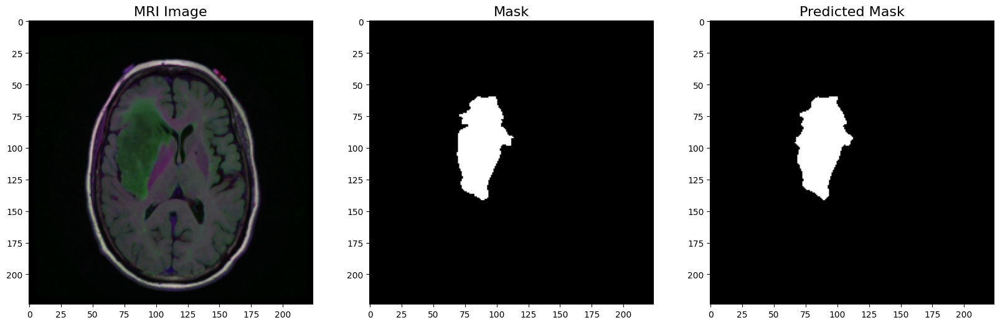

In [ ]:
view_multiple_predictions(sample_model, test_diagnosed_ds, count=5, color_map= 'rgb', fig_size=(20,38))

In [ ]:
def plot_training_curves(history, fig_size= (16,8), titile_size= 16):

  loss= np.array(history['loss'])
  val_loss= np.array(history['eval_loss'])
  dice_coef= np.array(history['loss_score'])
  eval_dice_coef= np.array(history['eval_score'])

  epochs= range(len(history['loss']))

  fig, (ax1, ax2)= plt.subplots(2, 1, figsize= fig_size)

  ax1.plot(epochs, loss, label= 'Training Loss', marker= 'o', color= 'C5');
  ax1.plot(epochs, val_loss, label= 'Validation Loss', marker= 'o', color= 'C6');

  #Filling area between losses
  ax1.fill_between(epochs, loss, val_loss, where= (loss > val_loss), color= 'C5', alpha= 0.4, interpolate= True);
  ax2.fill_between(epochs, loss, val_loss, where= (loss< val_loss), color= 'C6', alpha= 0.4, interpolate= True);


  # Adding formatting
  ax1.set_title('Loss - The Lower The Better', fontsize= 22);
  ax1.set_xlabel('Epochs', fontsize= 18);
  ax1.set_ylabel('Loss', fontsize= 18);
  ax1.tick_params(axis= 'both', which= 'major', labelsize= 14);
  ax1.legend(fontsize= 14)

  ax2.plot(epochs, dice_coef, label= 'Training Dice Score', marker= 'o', color= 'C5')
  ax2.plot(epochs, eval_dice_coef, label= 'Validation Dice Score', marker= 'o', color= 'C6')

  ax2.fill_between(epochs, dice_coef, eval_dice_coef, where= (dice_coef > eval_dice_coef), color= 'C5', alpha= 0.4, interpolate= True);
  ax2.fill_between(epochs, dice_coef, eval_dice_coef, where= (dice_coef < eval_dice_coef), color= 'C6', alpha= 0.4 , interpolate= True);

  ax2.set_title('Dice Score - The Higher The Better', fontsize= 22);
  ax2.set_xlabel('Epochs', fontsize= 18);
  ax2.set_ylabel('Dice Score', fontsize= 18);
  ax2.tick_params(axis= 'both', which= 'major', labelsize= 14);
  ax2.legend(fontsize= 14)

  sns.despine()

  return




In [ ]:
sample_df= pd.DataFrame(unet_session_history)

NameError: name 'unet_session_history' is not defined

In [ ]:



plot_training_curves(unet_session_history, fig_size= (20, 20))

In [ ]:
def precision_(y_true, y_pred):
  intersection= (y_true * y_pred).sum()
  total_predicted_pixels= y_pred.sum()
  return (intersection/total_predicted_pixels).mean()

def recall_(y_true, y_pred):
  intersection= (y_true * y_pred).sum()
  total_true_pixels= y_true.sum()
  return (intersection/total_true_pixels).mean()

def dice_score(y_true, y_pred):
  eps= 1e-8
  intersection= (y_true * y_pred).sum()
  summation= (y_true + y_pred).sum()
  return ((2* intersection) / (summation + eps))

def jaccard_index(y_true, y_pred):
  eps= 1e-8
  intersection = (y_true * y_pred).sum()
  union= (y_true + y_pred).sum() - intersection
  return (intersection / (union+eps))


In [ ]:
def compute_metrics(
    model: nn.Module,
    sample_loader: torch.utils.data.DataLoader,
    device:torch.device
) -> np.ndarray:

  metrics= {
      'accuracy' : [],
      'precision': [],
      'recall' : [],
      'dice_score': [],
      'IoU': []
  }

  # Setting model into evaluation mode
  model.eval()

  with torch.inference_mode():

    for batch, (X, y) in enumerate(tqdm(sample_loader)):
      X= X.to(device)
      y= y.to(device)

      d0, _,_,_,_,_,_ = model(X)

      d0= F.sigmoid(d0)

      predicted_class= (d0 > 0.3).float()

      # Computing Batch metrices for each mask
      for true_mask, pred_mask in zip(y, predicted_class):
        acc= ((true_mask == pred_mask ).sum() / torch.numel(true_mask)).cpu().item()
        prec= precision_(true_mask, pred_mask).cpu().item()
        rec= recall_(true_mask, pred_mask).cpu().item()
        dice= dice_score(true_mask, pred_mask).cpu().item()
        iou= jaccard_index(true_mask, pred_mask).cpu().item()

        metrics['accuracy'].append(acc)
        metrics['precision'].append(prec)
        metrics['recall'].append(rec)
        metrics['dice_score'].append(dice)
        metrics['IoU'].append(iou)

  return metrics













In [ ]:
unet_metrics= compute_metrics(sample_model, test_dl, DEVICE)

100%|██████████| 767/767 [00:16<00:00, 46.13it/s]


In [ ]:
unet_test_df= test_df.copy()

unet_test_df= pd.concat((unet_test_df, pd.DataFrame(unet_metrics)), axis= 1)

#Generate Diagnosis Labels
unet_test_df['model_diagnosis']= [int(mask.max()) for mask in unet_test_masks]

unet_test_df

,id,patient,image_path,mask_path,diagnosis,accuracy,precision,recall,dice_score,IoU,model_diagnosis
0,22,TCGA_DU_A5TS_19970726,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1,0.996931,0.724719,0.982234,0.834052,0.715342,1
1,11,TCGA_DU_8165_19970205,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0,1.000000,NaN,NaN,0.000000,0.000000,0
2,58,TCGA_HT_7881_19981015,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0,1.000000,NaN,NaN,0.000000,0.000000,0
3,19,TCGA_DU_5853_19950823,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0,1.000000,NaN,NaN,0.000000,0.000000,0
4,1,TCGA_DU_7298_19910324,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0,1.000000,NaN,NaN,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...
762,29,TCGA_DU_6399_19830416,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1,0.998525,0.893913,0.975332,0.932849,0.874150,1
763,4,TCGA_DU_7294_19890104,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0,1.000000,NaN,NaN,0.000000,0.000000,0
764,11,TCGA_HT_8105_19980826,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0,1.000000,NaN,NaN,0.000000,0.000000,0
765,22,TCGA_DU_7014_19860618,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1,0.995994,0.508772,0.703883,0.590631,0.419075,1


In [ ]:
def generate_performance_scores(y_true, y_pred, log= True):
  model_accuracy= accuracy_score(y_true, y_pred)
  model_precision, model_recall, model_f1, _= (precision_recall_fscore_support(y_true, y_pred, average= 'weighted'))

  model_matthews_corrcoeff= matthews_corrcoef(y_true, y_pred)

  if log:
    print("===============================================")
    print(f'accuracy_score:\t\t{model_accuracy:.4f}\n')
    print("===============================================")
    print(f'precision_score:\t{model_precision:.4f}\n')
    print("===============================================")
    print(f'recall_score:\t\t{model_recall:.4f}\n')
    print("===============================================")
    print(f'f1_score:\t\t{model_f1:.4f}\n')
    print("===============================================")
    print(f'mathhews_corrcoef:\t{model_matthews_corrcoeff:.4f}\n')
    print("===============================================")

  performance_metrics= {
      'accuracy_score': model_accuracy,
      'precision_score': model_precision,
      'recall_score': model_recall,
      'f1_score':model_f1,
      'matthews_corrcoef':model_matthews_corrcoeff
  }
  return performance_metrics





In [ ]:
test_labels= unet_test_df['diagnosis'].to_numpy()

unet_predictions= unet_test_df['model_diagnosis'].to_numpy()

In [ ]:
generate_performance_scores(test_labels, unet_predictions, log= True )

accuracy_score:		97.2621

precision_score:	0.9726

recall_score:		0.9726

f1_score:		0.9725

mathhews_corrcoef:	0.9396



{'accuracy_score': 97.26205997392438,
 'precision_score': 0.972628339538105,
 'recall_score': 0.9726205997392438,
 'f1_score': 0.9725348017333668,
 'matthews_corrcoef': 0.9396041576173352}